<a href="https://colab.research.google.com/github/johnjkiran/TSAI/blob/S4/S6_Assignment_EVA4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [0]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

## Data Transformations

We first start with defining our data transformations. We need to think what our data is and how can we augment it to correct represent images which it might not see otherwise. 


In [0]:
# Train Phase transformations
train_transforms = transforms.Compose([
                                      #  transforms.Resize((28, 28)),
                                      #  transforms.ColorJitter(brightness=0.10, contrast=0.1, saturation=0.10, hue=0.1),
                                       transforms.RandomRotation((-7.0, 7.0), fill=(1,)),
                                       transforms.ToTensor(),
                                       transforms.Normalize((0.1307,), (0.3081,)) # The mean and std have to be sequences (e.g., tuples), therefore you should add a comma after the values. 
                                       # Note the difference between (0.1307) and (0.1307,)
                                       ])

# Test Phase transformations
test_transforms = transforms.Compose([
                                      #  transforms.Resize((28, 28)),
                                      #  transforms.ColorJitter(brightness=0.10, contrast=0.1, saturation=0.10, hue=0.1),
                                       transforms.ToTensor(),
                                       transforms.Normalize((0.1307,), (0.3081,))
                                       ])


# Dataset and Creating Train/Test Split

In [0]:
train = datasets.MNIST('./data', train=True, download=True, transform=train_transforms)
test = datasets.MNIST('./data', train=False, download=True, transform=test_transforms)


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!


# Dataloader Arguments & Test/Train Dataloaders


In [0]:
SEED = 1

# CUDA?
cuda = torch.cuda.is_available()
print("CUDA Available?", cuda)

# For reproducibility
torch.manual_seed(SEED)

if cuda:
    torch.cuda.manual_seed(SEED)

# dataloader arguments - something you'll fetch these from cmdprmt
dataloader_args = dict(shuffle=True, batch_size=128, num_workers=4, pin_memory=True) if cuda else dict(shuffle=True, batch_size=64)

# train dataloader
train_loader = torch.utils.data.DataLoader(train, **dataloader_args)

# test dataloader
test_loader = torch.utils.data.DataLoader(test, **dataloader_args)

CUDA Available? True


# The model
Let's start with the model we first saw

In [0]:
import torch.nn.functional as F
dropout_value = 0.05
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # Input Block
        self.convblock1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=16, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(dropout_value)
        ) # output_size = 26, RF = 3

        # CONVOLUTION BLOCK 1
        self.convblock2 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=16, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.Dropout(dropout_value)
        ) # output_size = 24, RF = 5

        # TRANSITION BLOCK 1
        
        self.convblock3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=10, kernel_size=(1, 1), padding=0, bias=False),
        ) # output_size = 24, RF = 5

        self.pool1 = nn.MaxPool2d(2, 2) # output_size = 12

        self.convblock4 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=10, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(10),
            nn.Dropout(dropout_value)
        ) # output_size = 10, RF = 10

        self.convblock4_1 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=10, kernel_size=(3, 3), padding=1, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(10),
            nn.Dropout(dropout_value)
        ) # output_size = 10, RF = 14
       # CONVOLUTION BLOCK 2
        self.convblock5 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=10, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(10),
            nn.Dropout(dropout_value)
        ) # output_size = 8, RF = 18
        self.convblock6 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=10, kernel_size=(3, 3), padding=0, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(10),
            nn.Dropout(dropout_value)
        ) # output_size = 6, RF = 22

        self.convblock7 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=32, kernel_size=(3, 3), padding=1, bias=False),
            nn.ReLU(),
            nn.BatchNorm2d(32),
            nn.Dropout(dropout_value)
        ) # output_size = 6, RF = 26
        # OUTPUT BLOCK
        self.gap = nn.Sequential(
            nn.AvgPool2d(kernel_size=6)
        ) # output_size = 1
        self.convblock8 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=10, kernel_size=(1, 1), padding=0, bias=False),
            # nn.BatchNorm2d(10),
            # nn.ReLU(),
            # nn.Dropout(dropout_value)
        ) 

    def forward(self, x):
        x = self.convblock1(x)
        x = self.convblock2(x)
        x = self.convblock3(x)
        x = self.pool1(x)
        x = self.convblock4(x)
        x = self.convblock4_1(x)
        x = self.convblock5(x)
        x = self.convblock6(x)
        x = self.convblock7(x)
        x = self.gap(x)  
        x = self.convblock8(x)
        x = x.view(-1, 10)
        return F.log_softmax(x, dim=-1)

# Model Params
Can't emphasize on how important viewing Model Summary is. 
Unfortunately, there is no in-built model visualizer, so we have to take external help

In [0]:
!pip install torchsummary
from torchsummary import summary
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)
model = Net().to(device)
summary(model, input_size=(1, 28, 28))

cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             144
              ReLU-2           [-1, 16, 26, 26]               0
       BatchNorm2d-3           [-1, 16, 26, 26]              32
           Dropout-4           [-1, 16, 26, 26]               0
            Conv2d-5           [-1, 16, 24, 24]           2,304
              ReLU-6           [-1, 16, 24, 24]               0
       BatchNorm2d-7           [-1, 16, 24, 24]              32
           Dropout-8           [-1, 16, 24, 24]               0
            Conv2d-9           [-1, 10, 24, 24]             160
        MaxPool2d-10           [-1, 10, 12, 12]               0
           Conv2d-11           [-1, 10, 10, 10]             900
             ReLU-12           [-1, 10, 10, 10]               0
      BatchNorm2d-13           [-1, 10, 10, 10]              20
          Dropout-14           [-1

# Training and Testing

All right, so we have 24M params, and that's too many, we know that. But the purpose of this notebook is to set things right for our future experiments. 

Looking at logs can be boring, so we'll introduce **tqdm** progressbar to get cooler logs. 

Let's write train and test functions

In [0]:
# Base Model
from tqdm import tqdm

train_losses = []
test_losses = []
train_acc = []
test_acc = []

def train(model, device, train_loader, optimizer, epoch):
  model.train()
  pbar = tqdm(train_loader)
  correct = 0
  processed = 0
  for batch_idx, (data, target) in enumerate(pbar):
    # get samples
    data, target = data.to(device), target.to(device)

    # Init
    optimizer.zero_grad()
    # In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes. 
    # Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly.

    # Predict
    y_pred = model(data)

    # Calculate loss
    loss = F.nll_loss(y_pred, target)
    train_losses.append(loss)

    # Backpropagation
    loss.backward()
    optimizer.step()

    # Update pbar-tqdm
    
    pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
    correct += pred.eq(target.view_as(pred)).sum().item()
    processed += len(data)

    pbar.set_description(desc= f'Loss={loss.item()} Batch_id={batch_idx} Accuracy={100*correct/processed:0.2f}')
    train_acc.append(100*correct/processed)

def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    test_losses.append(test_loss)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    test_acc.append(100. * correct / len(test_loader.dataset))

In [54]:
from torch.optim.lr_scheduler import StepLR

model =  Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
# scheduler = StepLR(optimizer, step_size=6, gamma=0.1)


EPOCHS = 40
for epoch in range(EPOCHS):
    print("EPOCH:", epoch)
    train(model, device, train_loader, optimizer, epoch)
    # scheduler.step()
    test(model, device, test_loader)






  0%|          | 0/469 [00:00<?, ?it/s]

EPOCH: 0







Loss=2.2939770221710205 Batch_id=0 Accuracy=12.50:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=2.2939770221710205 Batch_id=0 Accuracy=12.50:   0%|          | 1/469 [00:00<03:10,  2.45it/s]




Loss=2.3070247173309326 Batch_id=1 Accuracy=12.50:   0%|          | 1/469 [00:00<03:10,  2.45it/s]




Loss=2.2847042083740234 Batch_id=2 Accuracy=13.28:   0%|          | 1/469 [00:00<03:10,  2.45it/s]




Loss=2.2847042083740234 Batch_id=2 Accuracy=13.28:   1%|          | 3/469 [00:00<02:20,  3.32it/s]




Loss=2.292818784713745 Batch_id=3 Accuracy=13.09:   1%|          | 3/469 [00:00<02:20,  3.32it/s] 




Loss=2.274038553237915 Batch_id=4 Accuracy=12.50:   1%|          | 3/469 [00:00<02:20,  3.32it/s]




Loss=2.2609684467315674 Batch_id=5 Accuracy=13.41:   1%|          | 3/469 [00:00<02:20,  3.32it/s]




Loss=2.2609684467315674 Batch_id=5 Accuracy=13.41:   1%|▏         | 6/469 [00:00<01:43,  4.48it/s]




Loss=2.2691915035247803 Batch_id=6 Accuracy=13.50:   1%|▏         | 6/469 [00


Test set: Average loss: 0.0766, Accuracy: 9776/10000 (97.76%)

EPOCH: 1







Loss=0.27307552099227905 Batch_id=0 Accuracy=92.19:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.27307552099227905 Batch_id=0 Accuracy=92.19:   0%|          | 1/469 [00:00<02:51,  2.74it/s]




Loss=0.19123809039592743 Batch_id=1 Accuracy=92.97:   0%|          | 1/469 [00:00<02:51,  2.74it/s]




Loss=0.06886958330869675 Batch_id=2 Accuracy=94.53:   0%|          | 1/469 [00:00<02:51,  2.74it/s]




Loss=0.07305270433425903 Batch_id=3 Accuracy=95.51:   0%|          | 1/469 [00:00<02:51,  2.74it/s]




Loss=0.07305270433425903 Batch_id=3 Accuracy=95.51:   1%|          | 4/469 [00:00<02:04,  3.73it/s]




Loss=0.040809158235788345 Batch_id=4 Accuracy=96.41:   1%|          | 4/469 [00:00<02:04,  3.73it/s]




Loss=0.1514902263879776 Batch_id=5 Accuracy=96.35:   1%|          | 4/469 [00:00<02:04,  3.73it/s]  




Loss=0.12924498319625854 Batch_id=6 Accuracy=96.54:   1%|          | 4/469 [00:00<02:04,  3.73it/s]




Loss=0.12924498319625854 Batch_id=6 Accuracy=96.54:   1%|▏       


Test set: Average loss: 0.0512, Accuracy: 9849/10000 (98.49%)

EPOCH: 2







Loss=0.037472765892744064 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.037472765892744064 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:01,  2.58it/s]




Loss=0.09024643898010254 Batch_id=1 Accuracy=97.27:   0%|          | 1/469 [00:00<03:01,  2.58it/s] 




Loss=0.08548684418201447 Batch_id=2 Accuracy=96.88:   0%|          | 1/469 [00:00<03:01,  2.58it/s]




Loss=0.09724005311727524 Batch_id=3 Accuracy=97.27:   0%|          | 1/469 [00:00<03:01,  2.58it/s]




Loss=0.09724005311727524 Batch_id=3 Accuracy=97.27:   1%|          | 4/469 [00:00<02:12,  3.52it/s]




Loss=0.0746908038854599 Batch_id=4 Accuracy=97.34:   1%|          | 4/469 [00:00<02:12,  3.52it/s] 




Loss=0.055149443447589874 Batch_id=5 Accuracy=97.53:   1%|          | 4/469 [00:00<02:12,  3.52it/s]




Loss=0.055149443447589874 Batch_id=5 Accuracy=97.53:   1%|▏         | 6/469 [00:00<01:39,  4.66it/s]




Loss=0.06908659636974335 Batch_id=6 Accuracy=97.54:   1%|▏    


Test set: Average loss: 0.0445, Accuracy: 9864/10000 (98.64%)

EPOCH: 3







Loss=0.04566673934459686 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.04566673934459686 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<02:12,  3.53it/s]




Loss=0.02834348753094673 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<02:12,  3.53it/s]




Loss=0.02834348753094673 Batch_id=1 Accuracy=98.44:   0%|          | 2/469 [00:00<01:55,  4.06it/s]




Loss=0.07484325766563416 Batch_id=2 Accuracy=97.66:   0%|          | 2/469 [00:00<01:55,  4.06it/s]




Loss=0.07968606054782867 Batch_id=3 Accuracy=98.05:   0%|          | 2/469 [00:00<01:55,  4.06it/s]




Loss=0.07968606054782867 Batch_id=3 Accuracy=98.05:   1%|          | 4/469 [00:00<01:27,  5.32it/s]




Loss=0.07119572162628174 Batch_id=4 Accuracy=97.81:   1%|          | 4/469 [00:00<01:27,  5.32it/s]




Loss=0.027642950415611267 Batch_id=5 Accuracy=98.18:   1%|          | 4/469 [00:00<01:27,  5.32it/s]




Loss=0.027642950415611267 Batch_id=5 Accuracy=98.18:   1%|▏       


Test set: Average loss: 0.0337, Accuracy: 9895/10000 (98.95%)

EPOCH: 4







Loss=0.04812891408801079 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.04812891408801079 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:21,  3.31it/s]




Loss=0.07201419025659561 Batch_id=1 Accuracy=98.05:   0%|          | 1/469 [00:00<02:21,  3.31it/s]




Loss=0.07201419025659561 Batch_id=1 Accuracy=98.05:   0%|          | 2/469 [00:00<01:55,  4.05it/s]




Loss=0.04136813431978226 Batch_id=2 Accuracy=98.18:   0%|          | 2/469 [00:00<01:55,  4.05it/s]




Loss=0.05114547163248062 Batch_id=3 Accuracy=98.24:   0%|          | 2/469 [00:00<01:55,  4.05it/s]




Loss=0.036883361637592316 Batch_id=4 Accuracy=98.44:   0%|          | 2/469 [00:00<01:55,  4.05it/s]




Loss=0.036883361637592316 Batch_id=4 Accuracy=98.44:   1%|          | 5/469 [00:00<01:25,  5.46it/s]




Loss=0.10049226880073547 Batch_id=5 Accuracy=98.31:   1%|          | 5/469 [00:00<01:25,  5.46it/s] 




Loss=0.07991120964288712 Batch_id=6 Accuracy=98.33:   1%|       


Test set: Average loss: 0.0337, Accuracy: 9898/10000 (98.98%)

EPOCH: 5







Loss=0.08324801921844482 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.08324801921844482 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<02:21,  3.30it/s]




Loss=0.08556485176086426 Batch_id=1 Accuracy=96.88:   0%|          | 1/469 [00:00<02:21,  3.30it/s]




Loss=0.08556485176086426 Batch_id=1 Accuracy=96.88:   0%|          | 2/469 [00:00<01:56,  4.00it/s]




Loss=0.06450991332530975 Batch_id=2 Accuracy=97.40:   0%|          | 2/469 [00:00<01:56,  4.00it/s]




Loss=0.05031895264983177 Batch_id=3 Accuracy=97.85:   0%|          | 2/469 [00:00<01:56,  4.00it/s]




Loss=0.11173322051763535 Batch_id=4 Accuracy=97.66:   0%|          | 2/469 [00:00<01:56,  4.00it/s]




Loss=0.11173322051763535 Batch_id=4 Accuracy=97.66:   1%|          | 5/469 [00:00<01:27,  5.33it/s]




Loss=0.045553453266620636 Batch_id=5 Accuracy=97.92:   1%|          | 5/469 [00:00<01:27,  5.33it/s]




Loss=0.03486653044819832 Batch_id=6 Accuracy=98.10:   1%|         


Test set: Average loss: 0.0302, Accuracy: 9899/10000 (98.99%)

EPOCH: 6







Loss=0.029460370540618896 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.029460370540618896 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:02,  2.56it/s]




Loss=0.018353555351495743 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<03:02,  2.56it/s]




Loss=0.05214865505695343 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<03:02,  2.56it/s] 




Loss=0.011908765882253647 Batch_id=3 Accuracy=99.02:   0%|          | 1/469 [00:00<03:02,  2.56it/s]




Loss=0.011908765882253647 Batch_id=3 Accuracy=99.02:   1%|          | 4/469 [00:00<02:12,  3.51it/s]




Loss=0.05606581270694733 Batch_id=4 Accuracy=98.75:   1%|          | 4/469 [00:00<02:12,  3.51it/s] 




Loss=0.05288060009479523 Batch_id=5 Accuracy=98.70:   1%|          | 4/469 [00:00<02:12,  3.51it/s]




Loss=0.028012670576572418 Batch_id=6 Accuracy=98.66:   1%|          | 4/469 [00:00<02:12,  3.51it/s]




Loss=0.028012670576572418 Batch_id=6 Accuracy=98.66:   1%|▏


Test set: Average loss: 0.0288, Accuracy: 9919/10000 (99.19%)

EPOCH: 7







Loss=0.03601076826453209 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.03601076826453209 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:16,  3.43it/s]




Loss=0.04699670150876045 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<02:16,  3.43it/s]




Loss=0.04699670150876045 Batch_id=1 Accuracy=98.83:   0%|          | 2/469 [00:00<01:51,  4.17it/s]




Loss=0.04194539785385132 Batch_id=2 Accuracy=98.70:   0%|          | 2/469 [00:00<01:51,  4.17it/s]




Loss=0.022252585738897324 Batch_id=3 Accuracy=98.83:   0%|          | 2/469 [00:00<01:51,  4.17it/s]




Loss=0.05368584766983986 Batch_id=4 Accuracy=98.75:   0%|          | 2/469 [00:00<01:51,  4.17it/s] 




Loss=0.03412311524152756 Batch_id=5 Accuracy=98.70:   0%|          | 2/469 [00:00<01:51,  4.17it/s]




Loss=0.03412311524152756 Batch_id=5 Accuracy=98.70:   1%|▏         | 6/469 [00:00<01:23,  5.52it/s]




Loss=0.03373856469988823 Batch_id=6 Accuracy=98.66:   1%|▏       


Test set: Average loss: 0.0263, Accuracy: 9924/10000 (99.24%)

EPOCH: 8







Loss=0.040574219077825546 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.040574219077825546 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:56,  2.65it/s]




Loss=0.008883468806743622 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<02:56,  2.65it/s]




Loss=0.07688490301370621 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<02:56,  2.65it/s] 




Loss=0.039667755365371704 Batch_id=3 Accuracy=98.83:   0%|          | 1/469 [00:00<02:56,  2.65it/s]




Loss=0.039667755365371704 Batch_id=3 Accuracy=98.83:   1%|          | 4/469 [00:00<02:07,  3.65it/s]




Loss=0.03596571460366249 Batch_id=4 Accuracy=98.91:   1%|          | 4/469 [00:00<02:07,  3.65it/s] 




Loss=0.02592601254582405 Batch_id=5 Accuracy=98.96:   1%|          | 4/469 [00:00<02:07,  3.65it/s]




Loss=0.034453269094228745 Batch_id=6 Accuracy=98.88:   1%|          | 4/469 [00:00<02:07,  3.65it/s]




Loss=0.034453269094228745 Batch_id=6 Accuracy=98.88:   1%|▏


Test set: Average loss: 0.0297, Accuracy: 9910/10000 (99.10%)

EPOCH: 9







Loss=0.03239820897579193 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.03239820897579193 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:57,  2.64it/s]




Loss=0.026095865294337273 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<02:57,  2.64it/s]




Loss=0.08950470387935638 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<02:57,  2.64it/s]  




Loss=0.056844212114810944 Batch_id=3 Accuracy=98.63:   0%|          | 1/469 [00:00<02:57,  2.64it/s]




Loss=0.056844212114810944 Batch_id=3 Accuracy=98.63:   1%|          | 4/469 [00:00<02:09,  3.60it/s]




Loss=0.0518922321498394 Batch_id=4 Accuracy=98.75:   1%|          | 4/469 [00:00<02:09,  3.60it/s]  




Loss=0.007629647850990295 Batch_id=5 Accuracy=98.96:   1%|          | 4/469 [00:00<02:09,  3.60it/s]




Loss=0.011537667363882065 Batch_id=6 Accuracy=99.11:   1%|          | 4/469 [00:00<02:09,  3.60it/s]




Loss=0.011537667363882065 Batch_id=6 Accuracy=99.11:   1


Test set: Average loss: 0.0306, Accuracy: 9911/10000 (99.11%)

EPOCH: 10







Loss=0.0907403901219368 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.0907403901219368 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<02:55,  2.67it/s]




Loss=0.02337673120200634 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<02:55,  2.67it/s]




Loss=0.04581332579255104 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<02:55,  2.67it/s]




Loss=0.04581332579255104 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<02:09,  3.60it/s]




Loss=0.06208718195557594 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:00<02:09,  3.60it/s]




Loss=0.02198057435452938 Batch_id=4 Accuracy=98.28:   1%|          | 3/469 [00:00<02:09,  3.60it/s]




Loss=0.0677870661020279 Batch_id=5 Accuracy=98.31:   1%|          | 3/469 [00:00<02:09,  3.60it/s] 




Loss=0.10518117249011993 Batch_id=6 Accuracy=98.21:   1%|          | 3/469 [00:00<02:09,  3.60it/s]




Loss=0.10518117249011993 Batch_id=6 Accuracy=98.21:   1%|▏         | 


Test set: Average loss: 0.0244, Accuracy: 9929/10000 (99.29%)

EPOCH: 11







Loss=0.03508215770125389 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.03508215770125389 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:57,  2.63it/s]




Loss=0.01816457137465477 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<02:57,  2.63it/s]




Loss=0.009967293590307236 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<02:57,  2.63it/s]




Loss=0.010835479944944382 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<02:57,  2.63it/s]




Loss=0.010835479944944382 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:09,  3.59it/s]




Loss=0.027901073917746544 Batch_id=4 Accuracy=99.38:   1%|          | 4/469 [00:00<02:09,  3.59it/s]




Loss=0.013182200491428375 Batch_id=5 Accuracy=99.48:   1%|          | 4/469 [00:00<02:09,  3.59it/s]




Loss=0.05417338013648987 Batch_id=6 Accuracy=99.33:   1%|          | 4/469 [00:00<02:09,  3.59it/s] 




Loss=0.05417338013648987 Batch_id=6 Accuracy=99.33:   1%|▏   


Test set: Average loss: 0.0214, Accuracy: 9932/10000 (99.32%)

EPOCH: 12







Loss=0.01280343160033226 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.01280343160033226 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:09,  3.61it/s]




Loss=0.008274786174297333 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<02:09,  3.61it/s]




Loss=0.008274786174297333 Batch_id=1 Accuracy=100.00:   0%|          | 2/469 [00:00<01:45,  4.42it/s]




Loss=0.04618743062019348 Batch_id=2 Accuracy=99.22:   0%|          | 2/469 [00:00<01:45,  4.42it/s]  




Loss=0.07954846322536469 Batch_id=3 Accuracy=98.83:   0%|          | 2/469 [00:00<01:45,  4.42it/s]




Loss=0.01283351331949234 Batch_id=4 Accuracy=98.91:   0%|          | 2/469 [00:00<01:45,  4.42it/s]




Loss=0.01283351331949234 Batch_id=4 Accuracy=98.91:   1%|          | 5/469 [00:00<01:20,  5.75it/s]




Loss=0.008951172232627869 Batch_id=5 Accuracy=99.09:   1%|          | 5/469 [00:00<01:20,  5.75it/s]




Loss=0.04944883659482002 Batch_id=6 Accuracy=99.00:   1%| 


Test set: Average loss: 0.0287, Accuracy: 9911/10000 (99.11%)

EPOCH: 13







Loss=0.008842192590236664 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.008842192590236664 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:45,  2.82it/s]




Loss=0.049077436327934265 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:45,  2.82it/s] 




Loss=0.05332934483885765 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<02:45,  2.82it/s] 




Loss=0.04870814457535744 Batch_id=3 Accuracy=98.83:   0%|          | 1/469 [00:00<02:45,  2.82it/s]




Loss=0.04152483865618706 Batch_id=4 Accuracy=98.91:   0%|          | 1/469 [00:00<02:45,  2.82it/s]




Loss=0.04152483865618706 Batch_id=4 Accuracy=98.91:   1%|          | 5/469 [00:00<01:59,  3.88it/s]




Loss=0.06914496421813965 Batch_id=5 Accuracy=98.70:   1%|          | 5/469 [00:00<01:59,  3.88it/s]




Loss=0.04034963250160217 Batch_id=6 Accuracy=98.66:   1%|          | 5/469 [00:00<01:59,  3.88it/s]




Loss=0.03901867941021919 Batch_id=7 Accuracy=98.73:   1%|   


Test set: Average loss: 0.0254, Accuracy: 9918/10000 (99.18%)

EPOCH: 14







Loss=0.008311405777931213 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.008311405777931213 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.009464185684919357 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.024648873135447502 Batch_id=2 Accuracy=99.74:   0%|          | 1/469 [00:00<02:52,  2.71it/s] 




Loss=0.032292939722537994 Batch_id=3 Accuracy=99.61:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.032292939722537994 Batch_id=3 Accuracy=99.61:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.005668073892593384 Batch_id=4 Accuracy=99.69:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.024432234466075897 Batch_id=5 Accuracy=99.61:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.011888325214385986 Batch_id=6 Accuracy=99.67:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.011888325214385986 Batch_id=6 Accuracy=99.67:  


Test set: Average loss: 0.0244, Accuracy: 9928/10000 (99.28%)

EPOCH: 15







Loss=0.013097666203975677 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.013097666203975677 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.020885523408651352 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<03:07,  2.50it/s] 




Loss=0.01880580745637417 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<03:07,  2.50it/s] 




Loss=0.02961636148393154 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.02961636148393154 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:16,  3.41it/s]




Loss=0.015243105590343475 Batch_id=4 Accuracy=99.53:   1%|          | 4/469 [00:00<02:16,  3.41it/s]




Loss=0.014146734029054642 Batch_id=5 Accuracy=99.48:   1%|          | 4/469 [00:00<02:16,  3.41it/s]




Loss=0.011494092643260956 Batch_id=6 Accuracy=99.44:   1%|          | 4/469 [00:00<02:16,  3.41it/s]




Loss=0.011494092643260956 Batch_id=6 Accuracy=99.44:   1%


Test set: Average loss: 0.0217, Accuracy: 9931/10000 (99.31%)

EPOCH: 16







Loss=0.025488393381237984 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.025488393381237984 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.04889517277479172 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<03:07,  2.50it/s] 




Loss=0.00578654557466507 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.042753785848617554 Batch_id=3 Accuracy=98.63:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.042753785848617554 Batch_id=3 Accuracy=98.63:   1%|          | 4/469 [00:00<02:15,  3.42it/s]




Loss=0.012134924530982971 Batch_id=4 Accuracy=98.91:   1%|          | 4/469 [00:00<02:15,  3.42it/s]




Loss=0.027804404497146606 Batch_id=5 Accuracy=98.96:   1%|          | 4/469 [00:00<02:15,  3.42it/s]




Loss=0.02733493596315384 Batch_id=6 Accuracy=99.00:   1%|          | 4/469 [00:00<02:15,  3.42it/s] 




Loss=0.02733493596315384 Batch_id=6 Accuracy=99.00:   1%|▏ 


Test set: Average loss: 0.0217, Accuracy: 9935/10000 (99.35%)

EPOCH: 17







Loss=0.016236785799264908 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.016236785799264908 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:02,  2.56it/s]




Loss=0.10896992683410645 Batch_id=1 Accuracy=98.05:   0%|          | 1/469 [00:00<03:02,  2.56it/s] 




Loss=0.021017715334892273 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<03:02,  2.56it/s]




Loss=0.021017715334892273 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<02:14,  3.45it/s]




Loss=0.03206479921936989 Batch_id=3 Accuracy=98.44:   1%|          | 3/469 [00:00<02:14,  3.45it/s] 




Loss=0.002698458731174469 Batch_id=4 Accuracy=98.75:   1%|          | 3/469 [00:00<02:14,  3.45it/s]




Loss=0.022335775196552277 Batch_id=5 Accuracy=98.57:   1%|          | 3/469 [00:00<02:14,  3.45it/s]




Loss=0.022335775196552277 Batch_id=5 Accuracy=98.57:   1%|▏         | 6/469 [00:00<01:39,  4.65it/s]




Loss=0.04821821302175522 Batch_id=6 Accuracy=98.66:   1%|▏


Test set: Average loss: 0.0238, Accuracy: 9922/10000 (99.22%)

EPOCH: 18







Loss=0.035157687962055206 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.035157687962055206 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:50,  2.74it/s]




Loss=0.021580494940280914 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:50,  2.74it/s]




Loss=0.1338272988796234 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<02:50,  2.74it/s]  




Loss=0.0842488557100296 Batch_id=3 Accuracy=98.63:   0%|          | 1/469 [00:00<02:50,  2.74it/s]




Loss=0.0842488557100296 Batch_id=3 Accuracy=98.63:   1%|          | 4/469 [00:00<02:04,  3.75it/s]




Loss=0.004778530448675156 Batch_id=4 Accuracy=98.91:   1%|          | 4/469 [00:00<02:04,  3.75it/s]




Loss=0.010547693818807602 Batch_id=5 Accuracy=99.09:   1%|          | 4/469 [00:00<02:04,  3.75it/s]




Loss=0.09950853884220123 Batch_id=6 Accuracy=99.00:   1%|          | 4/469 [00:00<02:04,  3.75it/s] 




Loss=0.09950853884220123 Batch_id=6 Accuracy=99.00:   1%|▏    


Test set: Average loss: 0.0229, Accuracy: 9936/10000 (99.36%)

EPOCH: 19







Loss=0.016628943383693695 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.016628943383693695 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:54,  2.68it/s]




Loss=0.01515381783246994 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:54,  2.68it/s] 




Loss=0.034484513103961945 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<02:54,  2.68it/s]




Loss=0.05607206001877785 Batch_id=3 Accuracy=99.02:   0%|          | 1/469 [00:00<02:54,  2.68it/s] 




Loss=0.05607206001877785 Batch_id=3 Accuracy=99.02:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.030475713312625885 Batch_id=4 Accuracy=99.06:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.018216855823993683 Batch_id=5 Accuracy=99.09:   1%|          | 4/469 [00:00<02:06,  3.67it/s]




Loss=0.02418162301182747 Batch_id=6 Accuracy=99.11:   1%|          | 4/469 [00:00<02:06,  3.67it/s] 




Loss=0.02418162301182747 Batch_id=6 Accuracy=99.11:   1%|▏ 


Test set: Average loss: 0.0201, Accuracy: 9935/10000 (99.35%)

EPOCH: 20







Loss=0.038540929555892944 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.038540929555892944 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:49,  2.76it/s]




Loss=0.03099466860294342 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<02:49,  2.76it/s] 




Loss=0.012566667050123215 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<02:49,  2.76it/s]




Loss=0.012566667050123215 Batch_id=2 Accuracy=98.70:   1%|          | 3/469 [00:00<02:06,  3.70it/s]




Loss=0.010584140196442604 Batch_id=3 Accuracy=99.02:   1%|          | 3/469 [00:00<02:06,  3.70it/s]




Loss=0.14831149578094482 Batch_id=4 Accuracy=98.59:   1%|          | 3/469 [00:00<02:06,  3.70it/s] 




Loss=0.02299490198493004 Batch_id=5 Accuracy=98.70:   1%|          | 3/469 [00:00<02:06,  3.70it/s]




Loss=0.02299490198493004 Batch_id=5 Accuracy=98.70:   1%|▏         | 6/469 [00:00<01:33,  4.95it/s]




Loss=0.02099824696779251 Batch_id=6 Accuracy=98.77:   1%|▏  


Test set: Average loss: 0.0170, Accuracy: 9942/10000 (99.42%)

EPOCH: 21







Loss=0.06799468398094177 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.06799468398094177 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.002676893025636673 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.015510689467191696 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.015510689467191696 Batch_id=2 Accuracy=99.48:   1%|          | 3/469 [00:00<02:15,  3.43it/s]




Loss=0.0645611509680748 Batch_id=3 Accuracy=99.22:   1%|          | 3/469 [00:00<02:15,  3.43it/s]  




Loss=0.06606405973434448 Batch_id=4 Accuracy=99.22:   1%|          | 3/469 [00:00<02:15,  3.43it/s]




Loss=0.06606405973434448 Batch_id=4 Accuracy=99.22:   1%|          | 5/469 [00:00<01:41,  4.56it/s]




Loss=0.006431423127651215 Batch_id=5 Accuracy=99.35:   1%|          | 5/469 [00:00<01:41,  4.56it/s]




Loss=0.10350488871335983 Batch_id=6 Accuracy=99.22:   1%|     


Test set: Average loss: 0.0178, Accuracy: 9942/10000 (99.42%)

EPOCH: 22







Loss=0.005760226398706436 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.005760226398706436 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:58,  2.62it/s]




Loss=0.006541367620229721 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<02:58,  2.62it/s]




Loss=0.03584956005215645 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<02:58,  2.62it/s]  




Loss=0.012385297566652298 Batch_id=3 Accuracy=99.61:   0%|          | 1/469 [00:00<02:58,  2.62it/s]




Loss=0.012385297566652298 Batch_id=3 Accuracy=99.61:   1%|          | 4/469 [00:00<02:10,  3.57it/s]




Loss=0.0029601193964481354 Batch_id=4 Accuracy=99.69:   1%|          | 4/469 [00:00<02:10,  3.57it/s]




Loss=0.03239107504487038 Batch_id=5 Accuracy=99.48:   1%|          | 4/469 [00:00<02:10,  3.57it/s]  




Loss=0.014477917924523354 Batch_id=6 Accuracy=99.44:   1%|          | 4/469 [00:00<02:10,  3.57it/s]




Loss=0.014477917924523354 Batch_id=6 Accuracy=99.44:


Test set: Average loss: 0.0196, Accuracy: 9935/10000 (99.35%)

EPOCH: 23







Loss=0.009826995432376862 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.009826995432376862 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.002777092158794403 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.02957657352089882 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<02:52,  2.72it/s] 




Loss=0.02957657352089882 Batch_id=2 Accuracy=99.48:   1%|          | 3/469 [00:00<02:07,  3.66it/s]




Loss=0.046333909034729004 Batch_id=3 Accuracy=99.22:   1%|          | 3/469 [00:00<02:07,  3.66it/s]




Loss=0.005645480006933212 Batch_id=4 Accuracy=99.38:   1%|          | 3/469 [00:00<02:07,  3.66it/s]




Loss=0.016072101891040802 Batch_id=5 Accuracy=99.48:   1%|          | 3/469 [00:00<02:07,  3.66it/s]




Loss=0.016072101891040802 Batch_id=5 Accuracy=99.48:   1%|▏         | 6/469 [00:00<01:34,  4.88it/s]




Loss=0.01077340543270111 Batch_id=6 Accuracy=99.55:   1%|▏ 


Test set: Average loss: 0.0209, Accuracy: 9935/10000 (99.35%)

EPOCH: 24







Loss=0.004673182964324951 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.004673182964324951 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.01544518955051899 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<02:52,  2.71it/s]  




Loss=0.007986314594745636 Batch_id=2 Accuracy=99.74:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.017493855208158493 Batch_id=3 Accuracy=99.61:   0%|          | 1/469 [00:00<02:52,  2.71it/s]




Loss=0.017493855208158493 Batch_id=3 Accuracy=99.61:   1%|          | 4/469 [00:00<02:05,  3.71it/s]




Loss=0.02557205781340599 Batch_id=4 Accuracy=99.38:   1%|          | 4/469 [00:00<02:05,  3.71it/s] 




Loss=0.02914406731724739 Batch_id=5 Accuracy=99.35:   1%|          | 4/469 [00:00<02:05,  3.71it/s]




Loss=0.018333833664655685 Batch_id=6 Accuracy=99.33:   1%|          | 4/469 [00:00<02:05,  3.71it/s]




Loss=0.018333833664655685 Batch_id=6 Accuracy=99.33:   1


Test set: Average loss: 0.0201, Accuracy: 9937/10000 (99.37%)

EPOCH: 25







Loss=0.024769335985183716 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.024769335985183716 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:31,  3.10it/s]




Loss=0.0032660067081451416 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:31,  3.10it/s]




Loss=0.0032660067081451416 Batch_id=1 Accuracy=99.22:   0%|          | 2/469 [00:00<02:00,  3.88it/s]




Loss=0.020990602672100067 Batch_id=2 Accuracy=98.96:   0%|          | 2/469 [00:00<02:00,  3.88it/s] 




Loss=0.009600624442100525 Batch_id=3 Accuracy=99.22:   0%|          | 2/469 [00:00<02:00,  3.88it/s]




Loss=0.018029239028692245 Batch_id=4 Accuracy=99.22:   0%|          | 2/469 [00:00<02:00,  3.88it/s]




Loss=0.018029239028692245 Batch_id=4 Accuracy=99.22:   1%|          | 5/469 [00:00<01:29,  5.21it/s]




Loss=0.012309644371271133 Batch_id=5 Accuracy=99.35:   1%|          | 5/469 [00:00<01:29,  5.21it/s]




Loss=0.05153530091047287 Batch_id=6 Accuracy=99.22:   1


Test set: Average loss: 0.0189, Accuracy: 9937/10000 (99.37%)

EPOCH: 26







Loss=0.034122154116630554 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.034122154116630554 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:03,  2.54it/s]




Loss=0.07477706670761108 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<03:03,  2.54it/s] 




Loss=0.014425091445446014 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<03:03,  2.54it/s]




Loss=0.0029143430292606354 Batch_id=3 Accuracy=99.02:   0%|          | 1/469 [00:00<03:03,  2.54it/s]




Loss=0.0029143430292606354 Batch_id=3 Accuracy=99.02:   1%|          | 4/469 [00:00<02:13,  3.49it/s]




Loss=0.006269734352827072 Batch_id=4 Accuracy=99.22:   1%|          | 4/469 [00:00<02:13,  3.49it/s] 




Loss=0.007589425891637802 Batch_id=5 Accuracy=99.35:   1%|          | 4/469 [00:00<02:13,  3.49it/s]




Loss=0.02026195451617241 Batch_id=6 Accuracy=99.33:   1%|          | 4/469 [00:00<02:13,  3.49it/s] 




Loss=0.02026195451617241 Batch_id=6 Accuracy=99.33:   1


Test set: Average loss: 0.0176, Accuracy: 9940/10000 (99.40%)

EPOCH: 27







Loss=0.02538679912686348 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.02538679912686348 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.03434403985738754 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.013183686882257462 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.02939368039369583 Batch_id=3 Accuracy=99.22:   0%|          | 1/469 [00:00<03:16,  2.38it/s] 




Loss=0.02939368039369583 Batch_id=3 Accuracy=99.22:   1%|          | 4/469 [00:00<02:21,  3.27it/s]




Loss=0.05191109701991081 Batch_id=4 Accuracy=99.22:   1%|          | 4/469 [00:00<02:21,  3.27it/s]




Loss=0.010101649910211563 Batch_id=5 Accuracy=99.35:   1%|          | 4/469 [00:00<02:21,  3.27it/s]




Loss=0.022685596719384193 Batch_id=6 Accuracy=99.33:   1%|          | 4/469 [00:00<02:21,  3.27it/s]




Loss=0.022685596719384193 Batch_id=6 Accuracy=99.33:   1%|▏    


Test set: Average loss: 0.0191, Accuracy: 9939/10000 (99.39%)

EPOCH: 28







Loss=0.024083657190203667 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.024083657190203667 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.010708611458539963 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.035823315382003784 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.045301903039216995 Batch_id=3 Accuracy=99.02:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.045301903039216995 Batch_id=3 Accuracy=99.02:   1%|          | 4/469 [00:00<02:26,  3.18it/s]




Loss=0.04120127856731415 Batch_id=4 Accuracy=98.91:   1%|          | 4/469 [00:00<02:26,  3.18it/s] 




Loss=0.020305722951889038 Batch_id=5 Accuracy=99.09:   1%|          | 4/469 [00:00<02:26,  3.18it/s]




Loss=0.03159771114587784 Batch_id=6 Accuracy=99.11:   1%|          | 4/469 [00:00<02:26,  3.18it/s] 




Loss=0.03159771114587784 Batch_id=6 Accuracy=99.11:   1%|▏


Test set: Average loss: 0.0177, Accuracy: 9942/10000 (99.42%)

EPOCH: 29







Loss=0.0349077433347702 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.0349077433347702 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:06,  2.52it/s]




Loss=0.02498447149991989 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:06,  2.52it/s]




Loss=0.028686463832855225 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<03:06,  2.52it/s]




Loss=0.005233243107795715 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:06,  2.52it/s]




Loss=0.005233243107795715 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:15,  3.44it/s]




Loss=0.024109255522489548 Batch_id=4 Accuracy=99.38:   1%|          | 4/469 [00:00<02:15,  3.44it/s]




Loss=0.03315078839659691 Batch_id=5 Accuracy=99.35:   1%|          | 4/469 [00:00<02:15,  3.44it/s] 




Loss=0.003176625818014145 Batch_id=6 Accuracy=99.44:   1%|          | 4/469 [00:00<02:15,  3.44it/s]




Loss=0.003176625818014145 Batch_id=6 Accuracy=99.44:   1%|▏    


Test set: Average loss: 0.0176, Accuracy: 9936/10000 (99.36%)

EPOCH: 30







Loss=0.011178545653820038 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.011178545653820038 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:49,  2.75it/s]




Loss=0.03588150814175606 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<02:49,  2.75it/s]  




Loss=0.008657056838274002 Batch_id=2 Accuracy=99.74:   0%|          | 1/469 [00:00<02:49,  2.75it/s]




Loss=0.008657056838274002 Batch_id=2 Accuracy=99.74:   1%|          | 3/469 [00:00<02:06,  3.68it/s]




Loss=0.0456533208489418 Batch_id=3 Accuracy=99.41:   1%|          | 3/469 [00:00<02:06,  3.68it/s]  




Loss=0.013810783624649048 Batch_id=4 Accuracy=99.38:   1%|          | 3/469 [00:00<02:06,  3.68it/s]




Loss=0.014541350305080414 Batch_id=5 Accuracy=99.35:   1%|          | 3/469 [00:00<02:06,  3.68it/s]




Loss=0.014541350305080414 Batch_id=5 Accuracy=99.35:   1%|▏         | 6/469 [00:00<01:33,  4.93it/s]




Loss=0.033336855471134186 Batch_id=6 Accuracy=99.22:   


Test set: Average loss: 0.0189, Accuracy: 9936/10000 (99.36%)

EPOCH: 31







Loss=0.002452455461025238 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.002452455461025238 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:36,  3.00it/s]




Loss=0.016917049884796143 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<02:36,  3.00it/s] 




Loss=0.016917049884796143 Batch_id=1 Accuracy=99.61:   0%|          | 2/469 [00:00<02:07,  3.66it/s]




Loss=0.009752491489052773 Batch_id=2 Accuracy=99.74:   0%|          | 2/469 [00:00<02:07,  3.66it/s]




Loss=0.020001370459794998 Batch_id=3 Accuracy=99.61:   0%|          | 2/469 [00:00<02:07,  3.66it/s]




Loss=0.03311947360634804 Batch_id=4 Accuracy=99.38:   0%|          | 2/469 [00:00<02:07,  3.66it/s] 




Loss=0.03311947360634804 Batch_id=4 Accuracy=99.38:   1%|          | 5/469 [00:00<01:34,  4.92it/s]




Loss=0.021443448960781097 Batch_id=5 Accuracy=99.35:   1%|          | 5/469 [00:00<01:34,  4.92it/s]




Loss=0.00573321059346199 Batch_id=6 Accuracy=99.44:   1%


Test set: Average loss: 0.0193, Accuracy: 9939/10000 (99.39%)

EPOCH: 32







Loss=0.009408406913280487 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.009408406913280487 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.034249499440193176 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:07,  2.50it/s] 




Loss=0.0026327185332775116 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<03:07,  2.50it/s]




Loss=0.01728709414601326 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:07,  2.50it/s]  




Loss=0.01728709414601326 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:15,  3.43it/s]




Loss=0.01363006979227066 Batch_id=4 Accuracy=99.38:   1%|          | 4/469 [00:00<02:15,  3.43it/s]




Loss=0.009499024599790573 Batch_id=5 Accuracy=99.48:   1%|          | 4/469 [00:00<02:15,  3.43it/s]




Loss=0.008803214877843857 Batch_id=6 Accuracy=99.55:   1%|          | 4/469 [00:00<02:15,  3.43it/s]




Loss=0.008803214877843857 Batch_id=6 Accuracy=99.55:   


Test set: Average loss: 0.0178, Accuracy: 9947/10000 (99.47%)

EPOCH: 33







Loss=0.01437828317284584 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.01437828317284584 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.003420371562242508 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.03940238431096077 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<03:15,  2.40it/s] 




Loss=0.007999785244464874 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.007999785244464874 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:21,  3.29it/s]




Loss=0.02481980063021183 Batch_id=4 Accuracy=99.38:   1%|          | 4/469 [00:00<02:21,  3.29it/s] 




Loss=0.07134255766868591 Batch_id=5 Accuracy=98.96:   1%|          | 4/469 [00:00<02:21,  3.29it/s]




Loss=0.0036409497261047363 Batch_id=6 Accuracy=99.11:   1%|          | 4/469 [00:00<02:21,  3.29it/s]




Loss=0.0036409497261047363 Batch_id=6 Accuracy=99.11:   1%|▏


Test set: Average loss: 0.0195, Accuracy: 9937/10000 (99.37%)

EPOCH: 34







Loss=0.01827321946620941 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.01827321946620941 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:31,  3.10it/s]




Loss=0.08006193488836288 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:31,  3.10it/s] 




Loss=0.02119731530547142 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<02:31,  3.10it/s]




Loss=0.02119731530547142 Batch_id=2 Accuracy=99.22:   1%|          | 3/469 [00:00<01:54,  4.08it/s]




Loss=0.015046905726194382 Batch_id=3 Accuracy=99.41:   1%|          | 3/469 [00:00<01:54,  4.08it/s]




Loss=0.01999426633119583 Batch_id=4 Accuracy=99.38:   1%|          | 3/469 [00:00<01:54,  4.08it/s] 




Loss=0.00577530637383461 Batch_id=5 Accuracy=99.48:   1%|          | 3/469 [00:00<01:54,  4.08it/s]




Loss=0.00577530637383461 Batch_id=5 Accuracy=99.48:   1%|▏         | 6/469 [00:00<01:24,  5.48it/s]




Loss=0.01693304255604744 Batch_id=6 Accuracy=99.44:   1%|▏    


Test set: Average loss: 0.0168, Accuracy: 9943/10000 (99.43%)

EPOCH: 35







Loss=0.00361672043800354 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.00361672043800354 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:58,  2.63it/s]




Loss=0.012214038521051407 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<02:58,  2.63it/s]




Loss=0.01350531354546547 Batch_id=2 Accuracy=99.74:   0%|          | 1/469 [00:00<02:58,  2.63it/s]  




Loss=0.004449706524610519 Batch_id=3 Accuracy=99.80:   0%|          | 1/469 [00:00<02:58,  2.63it/s]




Loss=0.004449706524610519 Batch_id=3 Accuracy=99.80:   1%|          | 4/469 [00:00<02:09,  3.58it/s]




Loss=0.04221507906913757 Batch_id=4 Accuracy=99.53:   1%|          | 4/469 [00:00<02:09,  3.58it/s] 




Loss=0.01082925871014595 Batch_id=5 Accuracy=99.61:   1%|          | 4/469 [00:00<02:09,  3.58it/s]




Loss=0.029338007792830467 Batch_id=6 Accuracy=99.44:   1%|          | 4/469 [00:00<02:09,  3.58it/s]




Loss=0.029338007792830467 Batch_id=6 Accuracy=99.44:   1%


Test set: Average loss: 0.0177, Accuracy: 9944/10000 (99.44%)

EPOCH: 36







Loss=0.0374017208814621 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.0374017208814621 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.02317628636956215 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.03972339630126953 Batch_id=2 Accuracy=98.18:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.007120784372091293 Batch_id=3 Accuracy=98.63:   0%|          | 1/469 [00:00<02:52,  2.72it/s]




Loss=0.007120784372091293 Batch_id=3 Accuracy=98.63:   1%|          | 4/469 [00:00<02:06,  3.69it/s]




Loss=0.043862055987119675 Batch_id=4 Accuracy=98.44:   1%|          | 4/469 [00:00<02:06,  3.69it/s]




Loss=0.04853292182087898 Batch_id=5 Accuracy=98.44:   1%|          | 4/469 [00:00<02:06,  3.69it/s] 




Loss=0.00873102992773056 Batch_id=6 Accuracy=98.66:   1%|          | 4/469 [00:00<02:06,  3.69it/s]




Loss=0.00873102992773056 Batch_id=6 Accuracy=98.66:   1%|▏       


Test set: Average loss: 0.0170, Accuracy: 9948/10000 (99.48%)

EPOCH: 37







Loss=0.04568510130047798 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.04568510130047798 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:47,  2.79it/s]




Loss=0.015366502106189728 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<02:47,  2.79it/s]




Loss=0.03174271434545517 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<02:47,  2.79it/s] 




Loss=0.03174271434545517 Batch_id=2 Accuracy=98.96:   1%|          | 3/469 [00:00<02:05,  3.72it/s]




Loss=0.04339403286576271 Batch_id=3 Accuracy=98.83:   1%|          | 3/469 [00:00<02:05,  3.72it/s]




Loss=0.015077345073223114 Batch_id=4 Accuracy=98.91:   1%|          | 3/469 [00:00<02:05,  3.72it/s]




Loss=0.010002385824918747 Batch_id=5 Accuracy=99.09:   1%|          | 3/469 [00:00<02:05,  3.72it/s]




Loss=0.010002385824918747 Batch_id=5 Accuracy=99.09:   1%|▏         | 6/469 [00:00<01:32,  4.98it/s]




Loss=0.03267940133810043 Batch_id=6 Accuracy=99.11:   1%|▏    


Test set: Average loss: 0.0148, Accuracy: 9955/10000 (99.55%)

EPOCH: 38







Loss=0.014342382550239563 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.014342382550239563 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:19,  2.34it/s]




Loss=0.022842127829790115 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:19,  2.34it/s] 




Loss=0.0038320161402225494 Batch_id=2 Accuracy=99.48:   0%|          | 1/469 [00:00<03:19,  2.34it/s]




Loss=0.03344970941543579 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:19,  2.34it/s]  




Loss=0.03344970941543579 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:24,  3.21it/s]




Loss=0.043340880423784256 Batch_id=4 Accuracy=99.22:   1%|          | 4/469 [00:00<02:24,  3.21it/s]




Loss=0.044678740203380585 Batch_id=5 Accuracy=98.96:   1%|          | 4/469 [00:00<02:24,  3.21it/s]




Loss=0.01131468266248703 Batch_id=6 Accuracy=99.11:   1%|          | 4/469 [00:00<02:24,  3.21it/s] 




Loss=0.01131468266248703 Batch_id=6 Accuracy=99.11:   


Test set: Average loss: 0.0173, Accuracy: 9945/10000 (99.45%)

EPOCH: 39







Loss=0.018673308193683624 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.018673308193683624 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.0037618689239025116 Batch_id=1 Accuracy=99.61:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.030382275581359863 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<03:03,  2.55it/s] 




Loss=0.003751847892999649 Batch_id=3 Accuracy=99.41:   0%|          | 1/469 [00:00<03:03,  2.55it/s]




Loss=0.003751847892999649 Batch_id=3 Accuracy=99.41:   1%|          | 4/469 [00:00<02:12,  3.50it/s]




Loss=0.010940052568912506 Batch_id=4 Accuracy=99.53:   1%|          | 4/469 [00:00<02:12,  3.50it/s]




Loss=0.06818506121635437 Batch_id=5 Accuracy=99.35:   1%|          | 4/469 [00:00<02:12,  3.50it/s] 




Loss=0.04906042665243149 Batch_id=6 Accuracy=99.22:   1%|          | 4/469 [00:00<02:12,  3.50it/s]




Loss=0.04906042665243149 Batch_id=6 Accuracy=99.22:   1%|


Test set: Average loss: 0.0190, Accuracy: 9939/10000 (99.39%)



Text(0.5, 1.0, 'Test Accuracy')

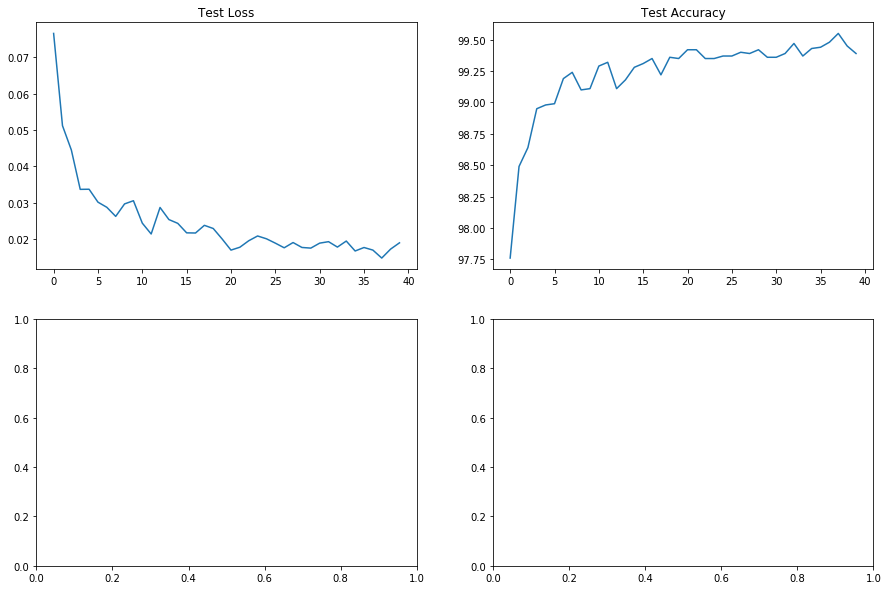

In [0]:
# Base Model
%matplotlib inline
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2,2,figsize=(15,10))
axs[0, 0].plot(test_losses)
axs[0, 0].set_title("Test Loss")
axs[0, 1].plot(test_acc)
axs[0, 1].set_title("Test Accuracy")

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')
!ls /content/gdrive/'My Drive'/

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
ls: cannot access '/content/gdrive/My': No such file or directory
ls: cannot access 'Drive': No such file or directory


In [0]:
model_save_name = 'model_without_L1L2'
path = F"/content/gdrive/'My Drive'/{model_save_name}" 
torch.save(model.state_dict(), path)
#model_save_name = 'model_without_L1L2'
#path = F"/content/gdrive/'My Drive'/{model_save_name}"
#model.load_state_dict(torch.load(path))

In [0]:
from tqdm import tqdm

train_losses_L1 = []
test_losses_L1 = []
train_acc_L1 = []
test_acc_L1 = []

def train(model, device, train_loader, optimizer, epoch):
  model.train()
  pbar = tqdm(train_loader)
  correct = 0
  processed = 0
  LAMBDA = 0.0005
  criterion = nn.CrossEntropyLoss().to(device)
  for batch_idx, (data, target) in enumerate(pbar):
    # get samples
    data, target = data.to(device), target.to(device)

    # Init
    optimizer.zero_grad()
    # In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes. 
    # Because of this, when you start your training loop, ideally you should zero out the gradients so that you do the parameter update correctly.

    # Predict
    y_pred = model(data)

    # Calculate loss
    #loss = F.nll_loss(y_pred, target)
    #train_losses.append(loss)
    #l1_crit = nn.L1Loss(size_average=False)
    regularization_loss = 0
    for param in model.parameters():
      regularization_loss += torch.sum(abs(param))
    classify_loss = criterion(y_pred,target)
    loss = classify_loss + LAMBDA * regularization_loss
    
    train_losses_L1.append(loss.item())
    # Backpropagation
    loss.backward()
    optimizer.step()

    # Update pbar-tqdm
    
    pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
    correct += pred.eq(target.view_as(pred)).sum().item()
    processed += len(data)

    pbar.set_description(desc= f'Loss={loss.item()} Batch_id={batch_idx} Accuracy={100*correct/processed:0.2f}')
    train_acc_L1.append(100*correct/processed)
  
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    test_losses_L1.append(test_loss)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    test_acc_L1.append(100. * correct / len(test_loader.dataset))

In [67]:
from torch.optim.lr_scheduler import StepLR

model =  Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
# scheduler = StepLR(optimizer, step_size=6, gamma=0.1)

EPOCHS = 40
for epoch in range(EPOCHS):
    print("EPOCH:", epoch)
    train(model, device, train_loader, optimizer, epoch)
    # scheduler.step()
    test(model, device, test_loader)






  0%|          | 0/469 [00:00<?, ?it/s]

EPOCH: 0







Loss=2.637672185897827 Batch_id=0 Accuracy=8.59:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=2.637672185897827 Batch_id=0 Accuracy=8.59:   0%|          | 1/469 [00:00<03:23,  2.30it/s]




Loss=2.6360650062561035 Batch_id=1 Accuracy=7.81:   0%|          | 1/469 [00:00<03:23,  2.30it/s]




Loss=2.6154587268829346 Batch_id=2 Accuracy=8.59:   0%|          | 1/469 [00:00<03:23,  2.30it/s]




Loss=2.6154587268829346 Batch_id=2 Accuracy=8.59:   1%|          | 3/469 [00:00<02:30,  3.10it/s]




Loss=2.5951640605926514 Batch_id=3 Accuracy=9.38:   1%|          | 3/469 [00:00<02:30,  3.10it/s]




Loss=2.584460735321045 Batch_id=4 Accuracy=10.16:   1%|          | 3/469 [00:00<02:30,  3.10it/s]




Loss=2.584460735321045 Batch_id=4 Accuracy=10.16:   1%|          | 5/469 [00:00<01:52,  4.13it/s]




Loss=2.5719165802001953 Batch_id=5 Accuracy=10.81:   1%|          | 5/469 [00:00<01:52,  4.13it/s]




Loss=2.5507946014404297 Batch_id=6 Accuracy=12.28:   1%|          | 5/469 [00:00<01:52


Test set: Average loss: 0.0961, Accuracy: 9743/10000 (97.43%)

EPOCH: 1







Loss=0.46645694971084595 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.46645694971084595 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<03:28,  2.24it/s]




Loss=0.413451611995697 Batch_id=1 Accuracy=96.48:   0%|          | 1/469 [00:00<03:28,  2.24it/s]  




Loss=0.3516298830509186 Batch_id=2 Accuracy=96.61:   0%|          | 1/469 [00:00<03:28,  2.24it/s]




Loss=0.3798867464065552 Batch_id=3 Accuracy=96.68:   0%|          | 1/469 [00:00<03:28,  2.24it/s]




Loss=0.3798867464065552 Batch_id=3 Accuracy=96.68:   1%|          | 4/469 [00:00<02:31,  3.06it/s]




Loss=0.3750596344470978 Batch_id=4 Accuracy=96.88:   1%|          | 4/469 [00:00<02:31,  3.06it/s]




Loss=0.36989080905914307 Batch_id=5 Accuracy=97.01:   1%|          | 4/469 [00:00<02:31,  3.06it/s]




Loss=0.36989080905914307 Batch_id=5 Accuracy=97.01:   1%|▏         | 6/469 [00:00<01:52,  4.10it/s]




Loss=0.3564404547214508 Batch_id=6 Accuracy=97.21:   1%|▏         | 6/4


Test set: Average loss: 0.0636, Accuracy: 9814/10000 (98.14%)

EPOCH: 2







Loss=0.3030136823654175 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.3030136823654175 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:20,  2.33it/s]




Loss=0.2732788920402527 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<03:20,  2.33it/s]




Loss=0.36327123641967773 Batch_id=2 Accuracy=97.92:   0%|          | 1/469 [00:00<03:20,  2.33it/s]




Loss=0.36327123641967773 Batch_id=2 Accuracy=97.92:   1%|          | 3/469 [00:00<02:28,  3.15it/s]




Loss=0.30693528056144714 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:00<02:28,  3.15it/s]




Loss=0.287295937538147 Batch_id=4 Accuracy=98.44:   1%|          | 3/469 [00:00<02:28,  3.15it/s]  




Loss=0.287295937538147 Batch_id=4 Accuracy=98.44:   1%|          | 5/469 [00:00<01:51,  4.17it/s]




Loss=0.3822329044342041 Batch_id=5 Accuracy=97.66:   1%|          | 5/469 [00:00<01:51,  4.17it/s]




Loss=0.31612202525138855 Batch_id=6 Accuracy=97.54:   1%|          | 5/46


Test set: Average loss: 0.0748, Accuracy: 9760/10000 (97.60%)

EPOCH: 3







Loss=0.33039069175720215 Batch_id=0 Accuracy=96.09:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.33039069175720215 Batch_id=0 Accuracy=96.09:   0%|          | 1/469 [00:00<02:55,  2.67it/s]




Loss=0.243790403008461 Batch_id=1 Accuracy=97.66:   0%|          | 1/469 [00:00<02:55,  2.67it/s]  




Loss=0.243790403008461 Batch_id=1 Accuracy=97.66:   0%|          | 2/469 [00:00<02:16,  3.41it/s]




Loss=0.24331530928611755 Batch_id=2 Accuracy=98.44:   0%|          | 2/469 [00:00<02:16,  3.41it/s]




Loss=0.26726096868515015 Batch_id=3 Accuracy=98.44:   0%|          | 2/469 [00:00<02:16,  3.41it/s]




Loss=0.26726096868515015 Batch_id=3 Accuracy=98.44:   1%|          | 4/469 [00:00<01:44,  4.47it/s]




Loss=0.2642962336540222 Batch_id=4 Accuracy=98.59:   1%|          | 4/469 [00:00<01:44,  4.47it/s] 




Loss=0.2852344512939453 Batch_id=5 Accuracy=98.31:   1%|          | 4/469 [00:00<01:44,  4.47it/s]




Loss=0.2852344512939453 Batch_id=5 Accuracy=98.31:   1%|▏         | 6/


Test set: Average loss: 0.0566, Accuracy: 9822/10000 (98.22%)

EPOCH: 4







Loss=0.21878468990325928 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.21878468990325928 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:20,  2.33it/s]




Loss=0.2767269015312195 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<03:20,  2.33it/s]  




Loss=0.22865603864192963 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:20,  2.33it/s]




Loss=0.22865603864192963 Batch_id=2 Accuracy=98.96:   1%|          | 3/469 [00:00<02:28,  3.14it/s]




Loss=0.3478817939758301 Batch_id=3 Accuracy=98.05:   1%|          | 3/469 [00:00<02:28,  3.14it/s] 




Loss=0.2319279909133911 Batch_id=4 Accuracy=98.12:   1%|          | 3/469 [00:00<02:28,  3.14it/s]




Loss=0.2319279909133911 Batch_id=4 Accuracy=98.12:   1%|          | 5/469 [00:00<01:51,  4.16it/s]




Loss=0.3378807306289673 Batch_id=5 Accuracy=97.79:   1%|          | 5/469 [00:00<01:51,  4.16it/s]




Loss=0.2906820476055145 Batch_id=6 Accuracy=97.77:   1%|          |


Test set: Average loss: 0.0447, Accuracy: 9870/10000 (98.70%)

EPOCH: 5







Loss=0.2758530378341675 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2758530378341675 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<03:30,  2.23it/s]




Loss=0.2999463379383087 Batch_id=1 Accuracy=97.27:   0%|          | 1/469 [00:00<03:30,  2.23it/s]




Loss=0.2321142703294754 Batch_id=2 Accuracy=97.66:   0%|          | 1/469 [00:00<03:30,  2.23it/s]




Loss=0.2321142703294754 Batch_id=2 Accuracy=97.66:   1%|          | 3/469 [00:00<02:36,  2.98it/s]




Loss=0.29125458002090454 Batch_id=3 Accuracy=97.46:   1%|          | 3/469 [00:00<02:36,  2.98it/s]




Loss=0.20574600994586945 Batch_id=4 Accuracy=97.97:   1%|          | 3/469 [00:00<02:36,  2.98it/s]




Loss=0.2813856303691864 Batch_id=5 Accuracy=97.92:   1%|          | 3/469 [00:00<02:36,  2.98it/s] 




Loss=0.2813856303691864 Batch_id=5 Accuracy=97.92:   1%|▏         | 6/469 [00:00<01:54,  4.03it/s]




Loss=0.26179784536361694 Batch_id=6 Accuracy=97.77:   1%|▏         | 6/46


Test set: Average loss: 0.0483, Accuracy: 9846/10000 (98.46%)

EPOCH: 6







Loss=0.2026127576828003 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2026127576828003 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:32,  3.08it/s]




Loss=0.23633968830108643 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<02:32,  3.08it/s]




Loss=0.23633968830108643 Batch_id=1 Accuracy=98.83:   0%|          | 2/469 [00:00<02:02,  3.82it/s]




Loss=0.22872410714626312 Batch_id=2 Accuracy=98.96:   0%|          | 2/469 [00:00<02:02,  3.82it/s]




Loss=0.21758422255516052 Batch_id=3 Accuracy=98.83:   0%|          | 2/469 [00:00<02:02,  3.82it/s]




Loss=0.21758422255516052 Batch_id=3 Accuracy=98.83:   1%|          | 4/469 [00:00<01:34,  4.91it/s]




Loss=0.2735767364501953 Batch_id=4 Accuracy=98.28:   1%|          | 4/469 [00:00<01:34,  4.91it/s] 




Loss=0.2897985875606537 Batch_id=5 Accuracy=98.18:   1%|          | 4/469 [00:00<01:34,  4.91it/s]




Loss=0.2897985875606537 Batch_id=5 Accuracy=98.18:   1%|▏         | 


Test set: Average loss: 0.0569, Accuracy: 9837/10000 (98.37%)

EPOCH: 7







Loss=0.2196132242679596 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2196132242679596 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:30,  2.22it/s]




Loss=0.28786951303482056 Batch_id=1 Accuracy=96.88:   0%|          | 1/469 [00:00<03:30,  2.22it/s]




Loss=0.2794482111930847 Batch_id=2 Accuracy=96.88:   0%|          | 1/469 [00:00<03:30,  2.22it/s] 




Loss=0.2794482111930847 Batch_id=2 Accuracy=96.88:   1%|          | 3/469 [00:00<02:34,  3.02it/s]




Loss=0.2678079307079315 Batch_id=3 Accuracy=96.88:   1%|          | 3/469 [00:00<02:34,  3.02it/s]




Loss=0.2701542377471924 Batch_id=4 Accuracy=97.03:   1%|          | 3/469 [00:00<02:34,  3.02it/s]




Loss=0.2701542377471924 Batch_id=4 Accuracy=97.03:   1%|          | 5/469 [00:00<01:54,  4.04it/s]




Loss=0.23807558417320251 Batch_id=5 Accuracy=97.27:   1%|          | 5/469 [00:00<01:54,  4.04it/s]




Loss=0.20530834794044495 Batch_id=6 Accuracy=97.54:   1%|          | 5/46


Test set: Average loss: 0.0419, Accuracy: 9888/10000 (98.88%)

EPOCH: 8







Loss=0.2719050645828247 Batch_id=0 Accuracy=95.31:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2719050645828247 Batch_id=0 Accuracy=95.31:   0%|          | 1/469 [00:00<03:26,  2.27it/s]




Loss=0.28803378343582153 Batch_id=1 Accuracy=96.09:   0%|          | 1/469 [00:00<03:26,  2.27it/s]




Loss=0.24189314246177673 Batch_id=2 Accuracy=96.88:   0%|          | 1/469 [00:00<03:26,  2.27it/s]




Loss=0.3014351725578308 Batch_id=3 Accuracy=97.27:   0%|          | 1/469 [00:00<03:26,  2.27it/s] 




Loss=0.3014351725578308 Batch_id=3 Accuracy=97.27:   1%|          | 4/469 [00:00<02:30,  3.09it/s]




Loss=0.2644282579421997 Batch_id=4 Accuracy=97.34:   1%|          | 4/469 [00:00<02:30,  3.09it/s]




Loss=0.24434179067611694 Batch_id=5 Accuracy=97.27:   1%|          | 4/469 [00:00<02:30,  3.09it/s]




Loss=0.24434179067611694 Batch_id=5 Accuracy=97.27:   1%|▏         | 6/469 [00:00<01:52,  4.10it/s]




Loss=0.2164047211408615 Batch_id=6 Accuracy=97.54:   1%|▏         | 6/4


Test set: Average loss: 0.0381, Accuracy: 9888/10000 (98.88%)

EPOCH: 9







Loss=0.2509067952632904 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2509067952632904 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:49,  2.77it/s]




Loss=0.18379926681518555 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:49,  2.77it/s]




Loss=0.18379926681518555 Batch_id=1 Accuracy=99.22:   0%|          | 2/469 [00:00<02:15,  3.45it/s]




Loss=0.2610124349594116 Batch_id=2 Accuracy=98.44:   0%|          | 2/469 [00:00<02:15,  3.45it/s] 




Loss=0.25219929218292236 Batch_id=3 Accuracy=98.24:   0%|          | 2/469 [00:00<02:15,  3.45it/s]




Loss=0.25219929218292236 Batch_id=3 Accuracy=98.24:   1%|          | 4/469 [00:00<01:42,  4.54it/s]




Loss=0.23755614459514618 Batch_id=4 Accuracy=98.28:   1%|          | 4/469 [00:00<01:42,  4.54it/s]




Loss=0.19742706418037415 Batch_id=5 Accuracy=98.57:   1%|          | 4/469 [00:00<01:42,  4.54it/s]




Loss=0.19742706418037415 Batch_id=5 Accuracy=98.57:   1%|▏         | 


Test set: Average loss: 0.0402, Accuracy: 9884/10000 (98.84%)

EPOCH: 10







Loss=0.19444291293621063 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.19444291293621063 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:49,  2.76it/s]




Loss=0.1927533745765686 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<02:49,  2.76it/s] 




Loss=0.1927533745765686 Batch_id=1 Accuracy=99.22:   0%|          | 2/469 [00:00<02:18,  3.38it/s]




Loss=0.21228636801242828 Batch_id=2 Accuracy=99.22:   0%|          | 2/469 [00:00<02:18,  3.38it/s]




Loss=0.1944621056318283 Batch_id=3 Accuracy=99.22:   0%|          | 2/469 [00:00<02:18,  3.38it/s] 




Loss=0.1944621056318283 Batch_id=3 Accuracy=99.22:   1%|          | 4/469 [00:00<01:44,  4.44it/s]




Loss=0.24710509181022644 Batch_id=4 Accuracy=98.75:   1%|          | 4/469 [00:00<01:44,  4.44it/s]




Loss=0.2179061621427536 Batch_id=5 Accuracy=98.83:   1%|          | 4/469 [00:00<01:44,  4.44it/s] 




Loss=0.2179061621427536 Batch_id=5 Accuracy=98.83:   1%|▏         | 6


Test set: Average loss: 0.0397, Accuracy: 9891/10000 (98.91%)

EPOCH: 11







Loss=0.28548213839530945 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.28548213839530945 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<03:15,  2.39it/s]




Loss=0.22445903718471527 Batch_id=1 Accuracy=97.66:   0%|          | 1/469 [00:00<03:15,  2.39it/s]




Loss=0.2025059312582016 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<03:15,  2.39it/s] 




Loss=0.2025059312582016 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<02:24,  3.23it/s]




Loss=0.23121598362922668 Batch_id=3 Accuracy=98.44:   1%|          | 3/469 [00:00<02:24,  3.23it/s]




Loss=0.1838507354259491 Batch_id=4 Accuracy=98.75:   1%|          | 3/469 [00:00<02:24,  3.23it/s] 




Loss=0.1838507354259491 Batch_id=4 Accuracy=98.75:   1%|          | 5/469 [00:00<01:49,  4.24it/s]




Loss=0.19270390272140503 Batch_id=5 Accuracy=98.96:   1%|          | 5/469 [00:00<01:49,  4.24it/s]




Loss=0.19875696301460266 Batch_id=6 Accuracy=98.88:   1%|          | 


Test set: Average loss: 0.0447, Accuracy: 9864/10000 (98.64%)

EPOCH: 12







Loss=0.28323933482170105 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.28323933482170105 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<03:25,  2.28it/s]




Loss=0.2125459760427475 Batch_id=1 Accuracy=98.05:   0%|          | 1/469 [00:00<03:25,  2.28it/s] 




Loss=0.2397010326385498 Batch_id=2 Accuracy=97.66:   0%|          | 1/469 [00:00<03:25,  2.28it/s]




Loss=0.2397010326385498 Batch_id=2 Accuracy=97.66:   1%|          | 3/469 [00:00<02:31,  3.07it/s]




Loss=0.229946568608284 Batch_id=3 Accuracy=97.66:   1%|          | 3/469 [00:00<02:31,  3.07it/s] 




Loss=0.24182990193367004 Batch_id=4 Accuracy=97.50:   1%|          | 3/469 [00:00<02:31,  3.07it/s]




Loss=0.23332232236862183 Batch_id=5 Accuracy=97.66:   1%|          | 3/469 [00:00<02:31,  3.07it/s]




Loss=0.23332232236862183 Batch_id=5 Accuracy=97.66:   1%|▏         | 6/469 [00:00<01:52,  4.12it/s]




Loss=0.21717900037765503 Batch_id=6 Accuracy=97.66:   1%|▏         | 6


Test set: Average loss: 0.0506, Accuracy: 9856/10000 (98.56%)

EPOCH: 13







Loss=0.19407741725444794 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.19407741725444794 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:33,  2.19it/s]




Loss=0.21192075312137604 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:33,  2.19it/s]




Loss=0.260957807302475 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<03:33,  2.19it/s]  




Loss=0.260957807302475 Batch_id=2 Accuracy=98.70:   1%|          | 3/469 [00:00<02:36,  2.99it/s]




Loss=0.17725776135921478 Batch_id=3 Accuracy=99.02:   1%|          | 3/469 [00:00<02:36,  2.99it/s]




Loss=0.20031699538230896 Batch_id=4 Accuracy=99.06:   1%|          | 3/469 [00:00<02:36,  2.99it/s]




Loss=0.20031699538230896 Batch_id=4 Accuracy=99.06:   1%|          | 5/469 [00:00<01:56,  3.98it/s]




Loss=0.3110751509666443 Batch_id=5 Accuracy=98.70:   1%|          | 5/469 [00:00<01:56,  3.98it/s] 




Loss=0.2423042505979538 Batch_id=6 Accuracy=98.33:   1%|          | 5


Test set: Average loss: 0.0379, Accuracy: 9887/10000 (98.87%)

EPOCH: 14







Loss=0.20357301831245422 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.20357301831245422 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<03:27,  2.26it/s]




Loss=0.1740211844444275 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<03:27,  2.26it/s] 




Loss=0.20780527591705322 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<03:27,  2.26it/s]




Loss=0.21900668740272522 Batch_id=3 Accuracy=98.24:   0%|          | 1/469 [00:00<03:27,  2.26it/s]




Loss=0.21900668740272522 Batch_id=3 Accuracy=98.24:   1%|          | 4/469 [00:00<02:30,  3.08it/s]




Loss=0.18843191862106323 Batch_id=4 Accuracy=98.44:   1%|          | 4/469 [00:00<02:30,  3.08it/s]




Loss=0.20718443393707275 Batch_id=5 Accuracy=98.44:   1%|          | 4/469 [00:00<02:30,  3.08it/s]




Loss=0.21412254869937897 Batch_id=6 Accuracy=98.44:   1%|          | 4/469 [00:00<02:30,  3.08it/s]




Loss=0.21412254869937897 Batch_id=6 Accuracy=98.44:   1%|▏         


Test set: Average loss: 0.0415, Accuracy: 9880/10000 (98.80%)

EPOCH: 15







Loss=0.21362151205539703 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.21362151205539703 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<03:36,  2.17it/s]




Loss=0.24034926295280457 Batch_id=1 Accuracy=97.66:   0%|          | 1/469 [00:00<03:36,  2.17it/s]




Loss=0.3107137680053711 Batch_id=2 Accuracy=96.88:   0%|          | 1/469 [00:00<03:36,  2.17it/s] 




Loss=0.3107137680053711 Batch_id=2 Accuracy=96.88:   1%|          | 3/469 [00:00<02:41,  2.89it/s]




Loss=0.20680972933769226 Batch_id=3 Accuracy=96.88:   1%|          | 3/469 [00:00<02:41,  2.89it/s]




Loss=0.2623952627182007 Batch_id=4 Accuracy=96.88:   1%|          | 3/469 [00:00<02:41,  2.89it/s] 




Loss=0.2623952627182007 Batch_id=4 Accuracy=96.88:   1%|          | 5/469 [00:00<02:01,  3.82it/s]




Loss=0.2735438942909241 Batch_id=5 Accuracy=96.88:   1%|          | 5/469 [00:00<02:01,  3.82it/s]




Loss=0.18489770591259003 Batch_id=6 Accuracy=97.21:   1%|          | 5


Test set: Average loss: 0.0517, Accuracy: 9828/10000 (98.28%)

EPOCH: 16







Loss=0.18880048394203186 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.18880048394203186 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<05:07,  1.52it/s]




Loss=0.20654822885990143 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<05:07,  1.52it/s]




Loss=0.1841752678155899 Batch_id=2 Accuracy=98.70:   0%|          | 1/469 [00:00<05:07,  1.52it/s] 




Loss=0.1841752678155899 Batch_id=2 Accuracy=98.70:   1%|          | 3/469 [00:00<03:44,  2.07it/s]




Loss=0.2152567207813263 Batch_id=3 Accuracy=98.44:   1%|          | 3/469 [00:00<03:44,  2.07it/s]




Loss=0.20946916937828064 Batch_id=4 Accuracy=98.44:   1%|          | 3/469 [00:00<03:44,  2.07it/s]




Loss=0.20946916937828064 Batch_id=4 Accuracy=98.44:   1%|          | 5/469 [00:00<02:45,  2.80it/s]




Loss=0.18716266751289368 Batch_id=5 Accuracy=98.57:   1%|          | 5/469 [00:00<02:45,  2.80it/s]




Loss=0.19935189187526703 Batch_id=6 Accuracy=98.55:   1%|          | 


Test set: Average loss: 0.0387, Accuracy: 9877/10000 (98.77%)

EPOCH: 17







Loss=0.2549973130226135 Batch_id=0 Accuracy=95.31:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2549973130226135 Batch_id=0 Accuracy=95.31:   0%|          | 1/469 [00:00<04:25,  1.76it/s]




Loss=0.29465025663375854 Batch_id=1 Accuracy=94.92:   0%|          | 1/469 [00:00<04:25,  1.76it/s]




Loss=0.20818406343460083 Batch_id=2 Accuracy=96.09:   0%|          | 1/469 [00:00<04:25,  1.76it/s]




Loss=0.20818406343460083 Batch_id=2 Accuracy=96.09:   1%|          | 3/469 [00:00<03:13,  2.40it/s]




Loss=0.25240999460220337 Batch_id=3 Accuracy=96.48:   1%|          | 3/469 [00:00<03:13,  2.40it/s]




Loss=0.2664954662322998 Batch_id=4 Accuracy=96.56:   1%|          | 3/469 [00:00<03:13,  2.40it/s] 




Loss=0.2664954662322998 Batch_id=4 Accuracy=96.56:   1%|          | 5/469 [00:00<02:23,  3.24it/s]




Loss=0.17751353979110718 Batch_id=5 Accuracy=97.14:   1%|          | 5/469 [00:00<02:23,  3.24it/s]




Loss=0.23007266223430634 Batch_id=6 Accuracy=97.21:   1%|          | 5


Test set: Average loss: 0.0402, Accuracy: 9881/10000 (98.81%)

EPOCH: 18







Loss=0.32456204295158386 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.32456204295158386 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<03:20,  2.34it/s]




Loss=0.2131289541721344 Batch_id=1 Accuracy=97.66:   0%|          | 1/469 [00:00<03:20,  2.34it/s] 




Loss=0.1917106807231903 Batch_id=2 Accuracy=97.92:   0%|          | 1/469 [00:00<03:20,  2.34it/s]




Loss=0.1917106807231903 Batch_id=2 Accuracy=97.92:   1%|          | 3/469 [00:00<02:27,  3.16it/s]




Loss=0.18106631934642792 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:00<02:27,  3.16it/s]




Loss=0.18157777190208435 Batch_id=4 Accuracy=98.44:   1%|          | 3/469 [00:00<02:27,  3.16it/s]




Loss=0.18157777190208435 Batch_id=4 Accuracy=98.44:   1%|          | 5/469 [00:00<01:51,  4.15it/s]




Loss=0.19484660029411316 Batch_id=5 Accuracy=98.44:   1%|          | 5/469 [00:00<01:51,  4.15it/s]




Loss=0.19012591242790222 Batch_id=6 Accuracy=98.55:   1%|          | 


Test set: Average loss: 0.0419, Accuracy: 9874/10000 (98.74%)

EPOCH: 19







Loss=0.22071687877178192 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.22071687877178192 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<02:43,  2.86it/s]




Loss=0.3258286416530609 Batch_id=1 Accuracy=95.70:   0%|          | 1/469 [00:00<02:43,  2.86it/s] 




Loss=0.3258286416530609 Batch_id=1 Accuracy=95.70:   0%|          | 2/469 [00:00<02:08,  3.63it/s]




Loss=0.16977320611476898 Batch_id=2 Accuracy=97.14:   0%|          | 2/469 [00:00<02:08,  3.63it/s]




Loss=0.20865675806999207 Batch_id=3 Accuracy=97.46:   0%|          | 2/469 [00:00<02:08,  3.63it/s]




Loss=0.20865675806999207 Batch_id=3 Accuracy=97.46:   1%|          | 4/469 [00:00<01:39,  4.68it/s]




Loss=0.23784810304641724 Batch_id=4 Accuracy=97.66:   1%|          | 4/469 [00:00<01:39,  4.68it/s]




Loss=0.2532274127006531 Batch_id=5 Accuracy=97.79:   1%|          | 4/469 [00:00<01:39,  4.68it/s] 




Loss=0.2532274127006531 Batch_id=5 Accuracy=97.79:   1%|▏         | 


Test set: Average loss: 0.0479, Accuracy: 9848/10000 (98.48%)

EPOCH: 20







Loss=0.2157975435256958 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2157975435256958 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<06:38,  1.17it/s]




Loss=0.1926984190940857 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<06:38,  1.17it/s]




Loss=0.21529395878314972 Batch_id=2 Accuracy=97.92:   0%|          | 1/469 [00:00<06:38,  1.17it/s]




Loss=0.21529395878314972 Batch_id=2 Accuracy=97.92:   1%|          | 3/469 [00:00<04:46,  1.62it/s]




Loss=0.1822999268770218 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:01<04:46,  1.62it/s] 




Loss=0.17623263597488403 Batch_id=4 Accuracy=98.59:   1%|          | 3/469 [00:01<04:46,  1.62it/s]




Loss=0.17623263597488403 Batch_id=4 Accuracy=98.59:   1%|          | 5/469 [00:01<03:28,  2.22it/s]




Loss=0.17431463301181793 Batch_id=5 Accuracy=98.83:   1%|          | 5/469 [00:01<03:28,  2.22it/s]




Loss=0.201351135969162 Batch_id=6 Accuracy=98.55:   1%|          | 5/4


Test set: Average loss: 0.0569, Accuracy: 9824/10000 (98.24%)

EPOCH: 21







Loss=0.20755140483379364 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.20755140483379364 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<05:11,  1.50it/s]




Loss=0.20055247843265533 Batch_id=1 Accuracy=97.27:   0%|          | 1/469 [00:00<05:11,  1.50it/s]




Loss=0.20055247843265533 Batch_id=1 Accuracy=97.27:   0%|          | 2/469 [00:00<03:54,  1.99it/s]




Loss=0.1908639371395111 Batch_id=2 Accuracy=97.40:   0%|          | 2/469 [00:00<03:54,  1.99it/s] 




Loss=0.1908639371395111 Batch_id=2 Accuracy=97.40:   1%|          | 3/469 [00:00<02:59,  2.60it/s]




Loss=0.1815275400876999 Batch_id=3 Accuracy=97.85:   1%|          | 3/469 [00:01<02:59,  2.60it/s]




Loss=0.1815275400876999 Batch_id=3 Accuracy=97.85:   1%|          | 4/469 [00:01<02:21,  3.29it/s]




Loss=0.186523899435997 Batch_id=4 Accuracy=98.12:   1%|          | 4/469 [00:01<02:21,  3.29it/s] 




Loss=0.2424822449684143 Batch_id=5 Accuracy=98.05:   1%|          | 4/4


Test set: Average loss: 0.0436, Accuracy: 9857/10000 (98.57%)

EPOCH: 22







Loss=0.1956886649131775 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.1956886649131775 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.18659426271915436 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.1938386708498001 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<03:16,  2.38it/s] 




Loss=0.1938386708498001 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<02:27,  3.17it/s]




Loss=0.2040051817893982 Batch_id=3 Accuracy=98.44:   1%|          | 3/469 [00:00<02:27,  3.17it/s]




Loss=0.19399303197860718 Batch_id=4 Accuracy=98.28:   1%|          | 3/469 [00:00<02:27,  3.17it/s]




Loss=0.19399303197860718 Batch_id=4 Accuracy=98.28:   1%|          | 5/469 [00:00<01:50,  4.20it/s]




Loss=0.18836404383182526 Batch_id=5 Accuracy=98.44:   1%|          | 5/469 [00:00<01:50,  4.20it/s]




Loss=0.25627651810646057 Batch_id=6 Accuracy=98.10:   1%|          | 5/


Test set: Average loss: 0.0425, Accuracy: 9869/10000 (98.69%)

EPOCH: 23







Loss=0.162056103348732 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.162056103348732 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:08,  2.49it/s]




Loss=0.17264948785305023 Batch_id=1 Accuracy=100.00:   0%|          | 1/469 [00:00<03:08,  2.49it/s]




Loss=0.192775696516037 Batch_id=2 Accuracy=99.74:   0%|          | 1/469 [00:00<03:08,  2.49it/s]   




Loss=0.17975027859210968 Batch_id=3 Accuracy=99.61:   0%|          | 1/469 [00:00<03:08,  2.49it/s]




Loss=0.17975027859210968 Batch_id=3 Accuracy=99.61:   1%|          | 4/469 [00:00<02:16,  3.39it/s]




Loss=0.17684100568294525 Batch_id=4 Accuracy=99.53:   1%|          | 4/469 [00:00<02:16,  3.39it/s]




Loss=0.1599011868238449 Batch_id=5 Accuracy=99.48:   1%|          | 4/469 [00:00<02:16,  3.39it/s] 




Loss=0.1599011868238449 Batch_id=5 Accuracy=99.48:   1%|▏         | 6/469 [00:00<01:43,  4.48it/s]




Loss=0.17675291001796722 Batch_id=6 Accuracy=99.33:   1%|▏         |


Test set: Average loss: 0.0480, Accuracy: 9847/10000 (98.47%)

EPOCH: 24







Loss=0.15456320345401764 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.15456320345401764 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<02:41,  2.89it/s]




Loss=0.265391081571579 Batch_id=1 Accuracy=98.05:   0%|          | 1/469 [00:00<02:41,  2.89it/s]   




Loss=0.2194438874721527 Batch_id=2 Accuracy=97.92:   0%|          | 1/469 [00:00<02:41,  2.89it/s]




Loss=0.2194438874721527 Batch_id=2 Accuracy=97.92:   1%|          | 3/469 [00:00<02:00,  3.86it/s]




Loss=0.16660316288471222 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:00<02:00,  3.86it/s]




Loss=0.2191605418920517 Batch_id=4 Accuracy=98.28:   1%|          | 3/469 [00:00<02:00,  3.86it/s] 




Loss=0.2191605418920517 Batch_id=4 Accuracy=98.28:   1%|          | 5/469 [00:00<01:31,  5.09it/s]




Loss=0.27887269854545593 Batch_id=5 Accuracy=97.92:   1%|          | 5/469 [00:00<01:31,  5.09it/s]




Loss=0.21420180797576904 Batch_id=6 Accuracy=97.99:   1%|          


Test set: Average loss: 0.0386, Accuracy: 9887/10000 (98.87%)

EPOCH: 25







Loss=0.22200867533683777 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.22200867533683777 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<04:16,  1.83it/s]




Loss=0.22744876146316528 Batch_id=1 Accuracy=97.66:   0%|          | 1/469 [00:00<04:16,  1.83it/s]




Loss=0.16724269092082977 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<04:16,  1.83it/s]




Loss=0.2101607620716095 Batch_id=3 Accuracy=98.44:   0%|          | 1/469 [00:00<04:16,  1.83it/s] 




Loss=0.2101607620716095 Batch_id=3 Accuracy=98.44:   1%|          | 4/469 [00:00<03:04,  2.52it/s]




Loss=0.18296125531196594 Batch_id=4 Accuracy=98.59:   1%|          | 4/469 [00:00<03:04,  2.52it/s]




Loss=0.17267021536827087 Batch_id=5 Accuracy=98.70:   1%|          | 4/469 [00:00<03:04,  2.52it/s]




Loss=0.17267021536827087 Batch_id=5 Accuracy=98.70:   1%|▏         | 6/469 [00:00<02:16,  3.40it/s]




Loss=0.1800580471754074 Batch_id=6 Accuracy=98.77:   1%|▏         | 


Test set: Average loss: 0.0506, Accuracy: 9845/10000 (98.45%)

EPOCH: 26







Loss=0.1726197451353073 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.1726197451353073 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<05:32,  1.41it/s]




Loss=0.259522020816803 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<05:32,  1.41it/s] 




Loss=0.2093457132577896 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<05:32,  1.41it/s]




Loss=0.2093457132577896 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<04:07,  1.88it/s]




Loss=0.20957127213478088 Batch_id=3 Accuracy=98.05:   1%|          | 3/469 [00:01<04:07,  1.88it/s]




Loss=0.33794867992401123 Batch_id=4 Accuracy=97.66:   1%|          | 3/469 [00:01<04:07,  1.88it/s]




Loss=0.33794867992401123 Batch_id=4 Accuracy=97.66:   1%|          | 5/469 [00:01<03:04,  2.51it/s]




Loss=0.21047823131084442 Batch_id=5 Accuracy=97.53:   1%|          | 5/469 [00:01<03:04,  2.51it/s]




Loss=0.24685925245285034 Batch_id=6 Accuracy=97.54:   1%|          | 5/4


Test set: Average loss: 0.0358, Accuracy: 9885/10000 (98.85%)

EPOCH: 27







Loss=0.19776451587677002 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.19776451587677002 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.17429718375205994 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.19593268632888794 Batch_id=2 Accuracy=98.18:   0%|          | 1/469 [00:00<03:15,  2.40it/s]




Loss=0.19593268632888794 Batch_id=2 Accuracy=98.18:   1%|          | 3/469 [00:00<02:25,  3.20it/s]




Loss=0.23846125602722168 Batch_id=3 Accuracy=97.66:   1%|          | 3/469 [00:00<02:25,  3.20it/s]




Loss=0.2352636307477951 Batch_id=4 Accuracy=97.66:   1%|          | 3/469 [00:00<02:25,  3.20it/s] 




Loss=0.2352636307477951 Batch_id=4 Accuracy=97.66:   1%|          | 5/469 [00:00<01:49,  4.22it/s]




Loss=0.17597463726997375 Batch_id=5 Accuracy=97.79:   1%|          | 5/469 [00:00<01:49,  4.22it/s]




Loss=0.1795487105846405 Batch_id=6 Accuracy=97.88:   1%|          | 


Test set: Average loss: 0.0427, Accuracy: 9876/10000 (98.76%)

EPOCH: 28







Loss=0.19067537784576416 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.19067537784576416 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:17,  2.37it/s]




Loss=0.1654280424118042 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:17,  2.37it/s] 




Loss=0.15435147285461426 Batch_id=2 Accuracy=99.22:   0%|          | 1/469 [00:00<03:17,  2.37it/s]




Loss=0.15435147285461426 Batch_id=2 Accuracy=99.22:   1%|          | 3/469 [00:00<02:27,  3.15it/s]




Loss=0.184404656291008 Batch_id=3 Accuracy=99.02:   1%|          | 3/469 [00:00<02:27,  3.15it/s]  




Loss=0.1912013441324234 Batch_id=4 Accuracy=98.91:   1%|          | 3/469 [00:00<02:27,  3.15it/s]




Loss=0.1912013441324234 Batch_id=4 Accuracy=98.91:   1%|          | 5/469 [00:00<01:52,  4.13it/s]




Loss=0.18950219452381134 Batch_id=5 Accuracy=98.70:   1%|          | 5/469 [00:00<01:52,  4.13it/s]




Loss=0.224361389875412 Batch_id=6 Accuracy=98.55:   1%|          | 5/


Test set: Average loss: 0.0396, Accuracy: 9869/10000 (98.69%)

EPOCH: 29







Loss=0.16190743446350098 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.16190743446350098 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:17,  2.37it/s]




Loss=0.1933901011943817 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<03:17,  2.37it/s] 




Loss=0.168306365609169 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:17,  2.37it/s] 




Loss=0.168306365609169 Batch_id=2 Accuracy=98.96:   1%|          | 3/469 [00:00<02:25,  3.19it/s]




Loss=0.1918349266052246 Batch_id=3 Accuracy=98.83:   1%|          | 3/469 [00:00<02:25,  3.19it/s]




Loss=0.15619505941867828 Batch_id=4 Accuracy=99.06:   1%|          | 3/469 [00:00<02:25,  3.19it/s]




Loss=0.15619505941867828 Batch_id=4 Accuracy=99.06:   1%|          | 5/469 [00:00<01:48,  4.26it/s]




Loss=0.18625445663928986 Batch_id=5 Accuracy=98.96:   1%|          | 5/469 [00:00<01:48,  4.26it/s]




Loss=0.16796234250068665 Batch_id=6 Accuracy=99.00:   1%|          | 5/


Test set: Average loss: 0.0432, Accuracy: 9852/10000 (98.52%)

EPOCH: 30







Loss=0.16150228679180145 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.16150228679180145 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<05:58,  1.31it/s]




Loss=0.19476525485515594 Batch_id=1 Accuracy=98.83:   0%|          | 1/469 [00:00<05:58,  1.31it/s]




Loss=0.21632307767868042 Batch_id=2 Accuracy=98.18:   0%|          | 1/469 [00:00<05:58,  1.31it/s]




Loss=0.21632307767868042 Batch_id=2 Accuracy=98.18:   1%|          | 3/469 [00:00<04:21,  1.78it/s]




Loss=0.19306446611881256 Batch_id=3 Accuracy=98.24:   1%|          | 3/469 [00:01<04:21,  1.78it/s]




Loss=0.15979498624801636 Batch_id=4 Accuracy=98.44:   1%|          | 3/469 [00:01<04:21,  1.78it/s]




Loss=0.15979498624801636 Batch_id=4 Accuracy=98.44:   1%|          | 5/469 [00:01<03:12,  2.41it/s]




Loss=0.19958925247192383 Batch_id=5 Accuracy=98.31:   1%|          | 5/469 [00:01<03:12,  2.41it/s]




Loss=0.30409783124923706 Batch_id=6 Accuracy=97.99:   1%|          


Test set: Average loss: 0.0478, Accuracy: 9847/10000 (98.47%)

EPOCH: 31







Loss=0.16098155081272125 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.16098155081272125 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<02:41,  2.90it/s]




Loss=0.23583552241325378 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<02:41,  2.90it/s]




Loss=0.1926802098751068 Batch_id=2 Accuracy=98.44:   0%|          | 1/469 [00:00<02:41,  2.90it/s] 




Loss=0.1926802098751068 Batch_id=2 Accuracy=98.44:   1%|          | 3/469 [00:00<02:02,  3.81it/s]




Loss=0.17590096592903137 Batch_id=3 Accuracy=98.63:   1%|          | 3/469 [00:00<02:02,  3.81it/s]




Loss=0.17426225543022156 Batch_id=4 Accuracy=98.91:   1%|          | 3/469 [00:00<02:02,  3.81it/s]




Loss=0.17426225543022156 Batch_id=4 Accuracy=98.91:   1%|          | 5/469 [00:00<01:32,  4.99it/s]




Loss=0.18191558122634888 Batch_id=5 Accuracy=98.83:   1%|          | 5/469 [00:00<01:32,  4.99it/s]




Loss=0.21630549430847168 Batch_id=6 Accuracy=98.77:   1%|          |


Test set: Average loss: 0.0408, Accuracy: 9874/10000 (98.74%)

EPOCH: 32







Loss=0.22262057662010193 Batch_id=0 Accuracy=96.88:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.22262057662010193 Batch_id=0 Accuracy=96.88:   0%|          | 1/469 [00:00<03:16,  2.38it/s]




Loss=0.2101978361606598 Batch_id=1 Accuracy=97.27:   0%|          | 1/469 [00:00<03:16,  2.38it/s] 




Loss=0.147938534617424 Batch_id=2 Accuracy=98.18:   0%|          | 1/469 [00:00<03:16,  2.38it/s] 




Loss=0.147938534617424 Batch_id=2 Accuracy=98.18:   1%|          | 3/469 [00:00<02:25,  3.20it/s]




Loss=0.24052011966705322 Batch_id=3 Accuracy=97.66:   1%|          | 3/469 [00:00<02:25,  3.20it/s]




Loss=0.2318231165409088 Batch_id=4 Accuracy=97.19:   1%|          | 3/469 [00:00<02:25,  3.20it/s] 




Loss=0.2318231165409088 Batch_id=4 Accuracy=97.19:   1%|          | 5/469 [00:00<01:49,  4.23it/s]




Loss=0.2072983831167221 Batch_id=5 Accuracy=97.40:   1%|          | 5/469 [00:00<01:49,  4.23it/s]




Loss=0.20371884107589722 Batch_id=6 Accuracy=97.43:   1%|          | 5/4


Test set: Average loss: 0.0425, Accuracy: 9873/10000 (98.73%)

EPOCH: 33







Loss=0.18501952290534973 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.18501952290534973 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<03:25,  2.28it/s]




Loss=0.16458562016487122 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:25,  2.28it/s]




Loss=0.19583964347839355 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:25,  2.28it/s]




Loss=0.19583964347839355 Batch_id=2 Accuracy=98.96:   1%|          | 3/469 [00:00<02:31,  3.07it/s]




Loss=0.179536372423172 Batch_id=3 Accuracy=98.83:   1%|          | 3/469 [00:00<02:31,  3.07it/s]  




Loss=0.20802423357963562 Batch_id=4 Accuracy=98.75:   1%|          | 3/469 [00:00<02:31,  3.07it/s]




Loss=0.20802423357963562 Batch_id=4 Accuracy=98.75:   1%|          | 5/469 [00:00<01:54,  4.05it/s]




Loss=0.17961636185646057 Batch_id=5 Accuracy=98.57:   1%|          | 5/469 [00:00<01:54,  4.05it/s]




Loss=0.15404008328914642 Batch_id=6 Accuracy=98.77:   1%|          


Test set: Average loss: 0.0409, Accuracy: 9873/10000 (98.73%)

EPOCH: 34







Loss=0.2143719345331192 Batch_id=0 Accuracy=97.66:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.2143719345331192 Batch_id=0 Accuracy=97.66:   0%|          | 1/469 [00:00<05:30,  1.42it/s]




Loss=0.24430014193058014 Batch_id=1 Accuracy=96.88:   0%|          | 1/469 [00:00<05:30,  1.42it/s]




Loss=0.24430014193058014 Batch_id=1 Accuracy=96.88:   0%|          | 2/469 [00:00<04:08,  1.88it/s]




Loss=0.1844586431980133 Batch_id=2 Accuracy=97.40:   0%|          | 2/469 [00:00<04:08,  1.88it/s] 




Loss=0.22717347741127014 Batch_id=3 Accuracy=97.07:   0%|          | 2/469 [00:00<04:08,  1.88it/s]




Loss=0.22717347741127014 Batch_id=3 Accuracy=97.07:   1%|          | 4/469 [00:00<03:03,  2.54it/s]




Loss=0.24271735548973083 Batch_id=4 Accuracy=97.03:   1%|          | 4/469 [00:01<03:03,  2.54it/s]




Loss=0.20106959342956543 Batch_id=5 Accuracy=97.14:   1%|          | 4/469 [00:01<03:03,  2.54it/s]




Loss=0.20106959342956543 Batch_id=5 Accuracy=97.14:   1%|▏         | 


Test set: Average loss: 0.0436, Accuracy: 9861/10000 (98.61%)

EPOCH: 35







Loss=0.24092063307762146 Batch_id=0 Accuracy=98.44:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.24092063307762146 Batch_id=0 Accuracy=98.44:   0%|          | 1/469 [00:00<06:20,  1.23it/s]




Loss=0.16679747402668 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<06:20,  1.23it/s]   




Loss=0.16679747402668 Batch_id=1 Accuracy=98.44:   0%|          | 2/469 [00:00<04:39,  1.67it/s]




Loss=0.18035142123699188 Batch_id=2 Accuracy=98.70:   0%|          | 2/469 [00:01<04:39,  1.67it/s]




Loss=0.18035142123699188 Batch_id=2 Accuracy=98.70:   1%|          | 3/469 [00:01<03:35,  2.17it/s]




Loss=0.26181167364120483 Batch_id=3 Accuracy=97.85:   1%|          | 3/469 [00:01<03:35,  2.17it/s]




Loss=0.2062351107597351 Batch_id=4 Accuracy=97.97:   1%|          | 3/469 [00:01<03:35,  2.17it/s] 




Loss=0.2062351107597351 Batch_id=4 Accuracy=97.97:   1%|          | 5/469 [00:01<02:43,  2.84it/s]




Loss=0.17882007360458374 Batch_id=5 Accuracy=97.92:   1%|          | 5/


Test set: Average loss: 0.0780, Accuracy: 9755/10000 (97.55%)

EPOCH: 36







Loss=0.14886368811130524 Batch_id=0 Accuracy=100.00:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.14886368811130524 Batch_id=0 Accuracy=100.00:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.19924984872341156 Batch_id=1 Accuracy=99.22:   0%|          | 1/469 [00:00<03:22,  2.31it/s] 




Loss=0.17669197916984558 Batch_id=2 Accuracy=98.96:   0%|          | 1/469 [00:00<03:22,  2.31it/s]




Loss=0.17669197916984558 Batch_id=2 Accuracy=98.96:   1%|          | 3/469 [00:00<02:30,  3.09it/s]




Loss=0.19412803649902344 Batch_id=3 Accuracy=99.02:   1%|          | 3/469 [00:00<02:30,  3.09it/s]




Loss=0.17998294532299042 Batch_id=4 Accuracy=98.75:   1%|          | 3/469 [00:00<02:30,  3.09it/s]




Loss=0.17998294532299042 Batch_id=4 Accuracy=98.75:   1%|          | 5/469 [00:00<01:53,  4.09it/s]




Loss=0.20032136142253876 Batch_id=5 Accuracy=98.57:   1%|          | 5/469 [00:00<01:53,  4.09it/s]




Loss=0.19861674308776855 Batch_id=6 Accuracy=98.33:   1%|       


Test set: Average loss: 0.0380, Accuracy: 9883/10000 (98.83%)

EPOCH: 37







Loss=0.17086265981197357 Batch_id=0 Accuracy=99.22:   0%|          | 0/469 [00:00<?, ?it/s]




Loss=0.17086265981197357 Batch_id=0 Accuracy=99.22:   0%|          | 1/469 [00:00<03:23,  2.30it/s]




Loss=0.1782827526330948 Batch_id=1 Accuracy=98.44:   0%|          | 1/469 [00:00<03:23,  2.30it/s] 




Loss=0.2198750078678131 Batch_id=2 Accuracy=98.18:   0%|          | 1/469 [00:00<03:23,  2.30it/s]




Loss=0.2198750078678131 Batch_id=2 Accuracy=98.18:   1%|          | 3/469 [00:00<02:31,  3.08it/s]




Loss=0.22755105793476105 Batch_id=3 Accuracy=97.85:   1%|          | 3/469 [00:00<02:31,  3.08it/s]




Loss=0.15644000470638275 Batch_id=4 Accuracy=98.28:   1%|          | 3/469 [00:00<02:31,  3.08it/s]




Loss=0.15644000470638275 Batch_id=4 Accuracy=98.28:   1%|          | 5/469 [00:00<01:52,  4.12it/s]




Loss=0.1601741760969162 Batch_id=5 Accuracy=98.57:   1%|          | 5/469 [00:00<01:52,  4.12it/s] 




Loss=0.2284577488899231 Batch_id=6 Accuracy=98.33:   1%|          | 5

Buffered data was truncated after reaching the output size limit.

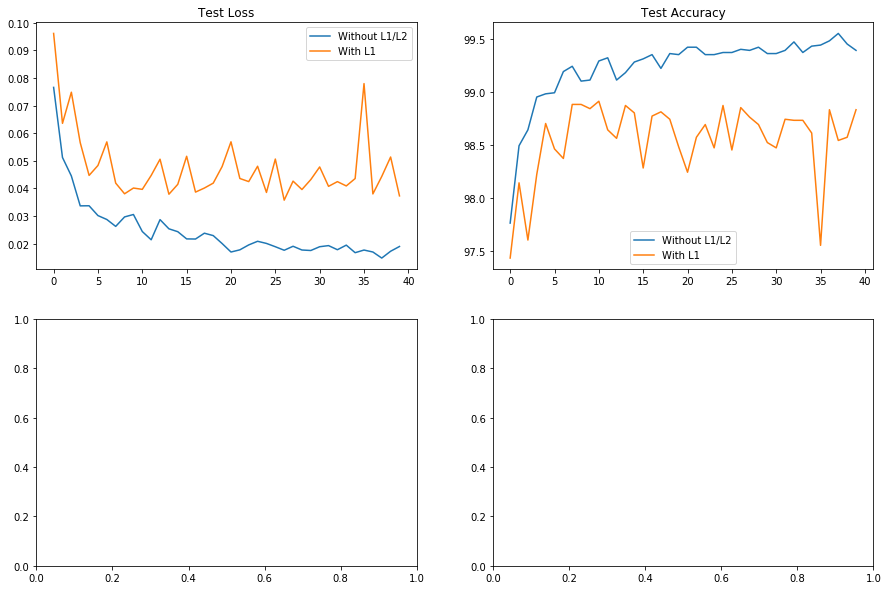

In [74]:
%matplotlib inline
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2,2,figsize=(15,10))
axs[0, 0].plot(test_losses,label = 'Without L1/L2')
axs[0, 0].plot(test_losses_L1,label = 'With L1')
axs[0, 0].set_title("Test Loss")
axs[0, 0].legend()
axs[0, 1].plot(test_acc,label = 'Without L1/L2')
axs[0, 1].plot(test_acc_L1,label = 'With L1')
axs[0, 1].set_title("Test Accuracy")
axs[0, 1].legend()

In [76]:
import pandas as pd
df = pd.DataFrame(list(zip(test_losses, test_losses_L1,test_acc,test_acc_L1)), 
               columns =['test_losses', 'test_losses_L1','test_acc','test_acc_L1']) 
df 

,test_losses,test_losses_L1,test_acc,test_acc_L1
0,0.076583,0.096111,97.76,97.43
1,0.051219,0.063569,98.49,98.14
2,0.044524,0.074837,98.64,97.60
3,0.033708,0.056581,98.95,98.22
4,0.033739,0.044722,98.98,98.70
5,0.030187,0.048330,98.99,98.46
6,0.028772,0.056863,99.19,98.37
7,0.026274,0.041939,99.24,98.88
8,0.029704,0.038073,99.10,98.88
9,0.030581,0.040157,99.11,98.84


In [0]:
from google.colab import files
df.to_csv('L1L2graphs.csv') 